<a href="https://colab.research.google.com/github/filbertmiko/Analysis-of-COVID-19-and-its-Impact-on-IHSG-and-Rupiah/blob/main/Final_Year_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Import Packages**

In [ ]:
#Import required packages
% pip install yfinance
% pip install pandas
% pip install tabula-py
% pip install kaggle
#% pip install googletrans==3.1.0a0

import matplotlib.pyplot as plt
import numpy as np
import tabula
import pandas as pd
import yfinance as yf
import io
import os
import json
import zipfile
from google.colab import files
from google.colab import data_table
from datetime import datetime, timedelta
from sklearn.linear_model import LinearRegression
import time
import seaborn as sns
from matplotlib.gridspec import GridSpec

     |████████████████████████████████| 5.5MB 10.5MB/s 
  Created wheel for yfinance: filename=yfinance-0.1.55-py2.py3-none-any.whl size=22616 sha256=7b71c2b0c65bee2ad560faaca2d4224000ed9e1aafe6d5131e5b98198c45c36d
  Stored in directory: /root/.cache/pip/wheels/04/98/cc/2702a4242d60bdc14f48b4557c427ded1fe92aedf257d4565c
Successfully built yfinance
  Found existing installation: lxml 4.2.6
    Uninstalling lxml-4.2.6:
      Successfully uninstalled lxml-4.2.6
     |████████████████████████████████| 11.7MB 8.5MB/s 


# **Connect to Github**

In [ ]:
#cloning github repository
!git clone https://github.com/filbertmiko/Analysis-of-COVID-19-and-its-Impact-on-IHSG-and-Rupiah.git

Cloning into 'Analysis-of-COVID-19-and-its-Impact-on-IHSG-and-Rupiah'...
remote: Enumerating objects: 56, done.
remote: Counting objects: 100% (56/56), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 56 (delta 23), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (56/56), done.


In [ ]:
#Move directory to cloned git repository
%cd /content/Analysis-of-COVID-19-and-its-Impact-on-IHSG-and-Rupiah
!pwd

/content/Analysis-of-COVID-19-and-its-Impact-on-IHSG-and-Rupiah
/content/Analysis-of-COVID-19-and-its-Impact-on-IHSG-and-Rupiah


In [ ]:
#Importing Kaggle Api json file using aslisabanci's code from github as a reference
#Importing dataset called covid19-indonesia created by user hendratno

#create the .kaggle directory and put credentials json file into it
!mkdir -p ~/.kaggle 
!cp kaggle.json ~/.kaggle/

#so that the kaggle.json which has the credentials file cannot be read by others
!chmod 600 /root/.kaggle/kaggle.json 

#downloads the zip file using the API provided by Kaggle
!kaggle datasets download -d hendratno/covid19-indonesia

#unzipping the zip files
!unzip \*.zip

  0% 0.00/386k [00:00<?, ?B/s]
100% 386k/386k [00:00<00:00, 55.9MB/s]
Archive:  covid19-indonesia.zip
  inflating: covid_19_indonesia_time_series_all.csv  


# **COVID-19 Pre-Processing**

## **Extract**

**Extract datasets from different data sources**



*   Our World in Data
*   CSV files that are converted from PDF that are stored in Github
*   COVID Open Data



In [ ]:
#File Paths for each sources
file_path_OWID = "https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv"
file_path_COVID_OPEN_DATA = "https://storage.googleapis.com/covid19-open-data/v2/by-sex.csv"
file_path_GRS = "https://raw.githubusercontent.com/OxCGRT/covid-policy-tracker/master/data/OxCGRT_latest.csv"
file_path_demographics = "https://storage.googleapis.com/covid19-open-data/v2/demographics.csv"
file_path_geography = "https://storage.googleapis.com/covid19-open-data/v2/geography.csv"
file_path_IQ = "/content/Analysis-of-COVID-19-and-its-Impact-on-IHSG-and-Rupiah/countriesByIQ.csv"
file_path_PR = "/content/Analysis-of-COVID-19-and-its-Impact-on-IHSG-and-Rupiah/povertyRate.csv"
file_path_index = "https://storage.googleapis.com/covid19-open-data/v2/index.csv"
file_path_indonesia = "/content/Analysis-of-COVID-19-and-its-Impact-on-IHSG-and-Rupiah/covid_19_indonesia_time_series_all.csv"
file_path_epidemiology = "https://storage.googleapis.com/covid19-open-data/v2/epidemiology.csv"

#Reads in the csv from each respective URL
COVID_df = pd.read_csv(file_path_OWID)
index_df = pd.read_csv(file_path_index)
demographics_df = pd.read_csv(file_path_demographics)
geo_df = pd.read_csv(file_path_geography)
iq_per_country_df = pd.read_csv(file_path_IQ)
poverty_rate_df = pd.read_csv(file_path_PR)
indonesia_df = pd.read_csv(file_path_indonesia)
worldwide_ts_df = pd.read_csv(file_path_epidemiology)
GR_df = pd.read_csv(file_path_GRS)

initial_df_list = ['COVID_df', 'index_df', 'demographics_df', 'geo_df',
                   'iq_per_country_df', 'poverty_rate_df', 'indonesia_df',
                   'worldwide_ts_df', 'GR_df']

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (2,3) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
#data_table.DataTable(index_df)

## **Clean**

**Data Cleansing**

1.   Removing Unwanted Columns
2.   Only Getting Wanted Columns
3.   Replace NaNs with 0 (when suitable)
4.   Rename Columns
5.   Change data type to the correct ones
6.   Fix capitalisation
7.   Remove rows that include unwanted value
8.   Translate elements into English





In [ ]:
#function to check if dataframes have any nulls
def df_contains_null():
  """
  Returns a list of dataframes that have nulls

  This function checks if each dataframes have any nulls. If it does,
  it will be appended to a list. The function will then return that
  list of dataframes that have nulls
  """

  null_df = []
  if COVID_df.isnull().values.any():
    null_df.append("COVID_df")
  if index_df.isnull().values.any():
    null_df.append('index_df')
  if demographics_df.isnull().values.any():
    null_df.append('demographics_df')
  if geo_df.isnull().values.any():
    null_df.append('geo_df')
  if iq_per_country_df.isnull().values.any():
    null_df.append('iq_per_country_df')
  if poverty_rate_df.isnull().values.any():
    null_df.append('poverty_rate_df')
  if indonesia_df.isnull().values.any():
    null_df.append('indonesia_df')
  if worldwide_ts_df.isnull().values.any():
    null_df.append('worldwide_ts_df')
  if GR_df.isnull().values.any():
    null_df.append('GR_df')
  
  return null_df

print("DFs with nulls:")
print(df_contains_null())

DFs with nulls:
['COVID_df', 'index_df', 'demographics_df', 'geo_df', 'iq_per_country_df', 'indonesia_df', 'worldwide_ts_df', 'GR_df']


In [ ]:
#Constants
DATE_FORMAT = '%Y-%m-%d'

#unwanted columns from COVID_df
remove_COVID_df_columns = ['reproduction_rate', 'icu_patients', 'icu_patients_per_million', 'hosp_patients', 'hosp_patients_per_million', 
                             'weekly_icu_admissions','weekly_icu_admissions_per_million', 'weekly_hosp_admissions', 'weekly_hosp_admissions_per_million', 
                             'new_cases_smoothed','new_deaths_smoothed', 'new_cases_smoothed_per_million','new_deaths_smoothed_per_million',
                             'new_tests_smoothed', 'new_tests_smoothed_per_thousand','new_vaccinations_smoothed', 
                             'new_vaccinations_smoothed_per_million', 'female_smokers', 'male_smokers']

#Remove unwanted columns for COVID_df
COVID_df = COVID_df.drop(remove_COVID_df_columns, axis=1)

#Rename location column to 'country_name'
COVID_df = COVID_df.rename(columns={'location': 'country_name'})

#Reformat date into the correct type
COVID_df['date'] = pd.to_datetime(COVID_df.date, format=DATE_FORMAT)

#Replace NaN with 0
COVID_df.fillna(0, inplace=True)

#Unwanted columns from iq_per_country_df
remove_iq_df_columns = ['rank', 'pop2020']
iq_per_country_df = iq_per_country_df.drop(remove_iq_df_columns, axis=1)
iq_per_country_df = iq_per_country_df.rename(columns={'country': 'country_name',
                                                           'iq': 'average_iq'})

#Capitalize the first letter for iq_per_country_df since the original file had
#all the country names in small letters
iq_per_country_df['country_name'] = iq_per_country_df['country_name'].str.capitalize()

#Sort the dataframe alphabetically 
iq_per_country_df = iq_per_country_df.sort_values('country_name')

In [ ]:
#Drops rows that 
index_df.dropna(subset = ["datacommons"], inplace=True)

#Change the type of key into string
index_df['key'] = index_df['key'].astype('str')

#Gets countries only from index dataframe.
#Length is set to 2 because countries only have 2 characters as key such as 
#ID, US, CH, TH, SG while the regions will contain extensions such as ID_JK, ID_JB
mask = index_df['key'].str.len() == 2
index_countries_df = index_df.loc[mask].copy()
index_countries_df.reset_index(drop=True)

#Only gets the wanted columns from index_df
wanted_index_columns = ['key', 'country_name']
index_df = index_df[wanted_index_columns]

#Replace NaNs with 0 if there are any
demographics_df.fillna(0, inplace=True)

#Only gets the wanted columns from demographics_df
wanted_demographics_columns = ['key','rural_population', 'urban_population']
demographics_df = demographics_df[wanted_demographics_columns]

#Only gets the wanted columns from geo_df
wanted_geo_columns = ['key', 'longitude', 'latitude']
geo_df = geo_df[wanted_geo_columns]

#Gets countries only from geo_df
mask = geo_df['key'].str.len() == 2
geo_df = geo_df.loc[mask]
geo_df.reset_index(drop=True)

#Drop rows with NaNs
geo_df = geo_df.dropna()

#Drops unwanted columns from poverty_rate_df 
poverty_rate_df = poverty_rate_df.drop(['pop2020'], axis=1)

#Sorts the table by sorting the country names alphabetically
poverty_rate_df = poverty_rate_df.sort_values('country')

#Renames the columns so that it will be in the same format as the other dataframes
poverty_rate_df = poverty_rate_df.rename(columns={'povertyRate': 'poverty_rate', 
                                                  'country': 'country_name'})

#Remove unwanted columns
unwanted_indonesia_df_columns = ['New Cases', 'New Deaths', 'New Recovered', 'New Active Cases',
                                 'Total Cases', 'Total Deaths', 'Total Recovered', 'Total Active Cases',
                                 'Location Level', 'City or Regency', 'Country', 'Continent', 'Time Zone',
                                 'Special Status', 'Total Regencies', 'Total Cities', 'Total Districts',
                                 'Growth Factor of New Cases', 'Growth Factor of New Deaths', 'Area (km2)',
                                 'Total Urban Villages', 'Total Rural Villages']
indonesia_df = indonesia_df.drop(unwanted_indonesia_df_columns, axis=1)

#Change format of ISO code to be uniform with the other datasets
indonesia_df['Location ISO Code'] = indonesia_df['Location ISO Code'].replace('-', '_', regex=True)

#Rename indonesia_df columns so it will be in the same format as the other dataframes
indonesia_df = indonesia_df.rename(columns={'Date': 'date', 'Location ISO Code': 'key',
                                            'Location': 'location', 'Province': 'province',
                                            'Island': 'island', 'Total Urban Villages': 'total_urban_villages',
                                            'Total Rural Villages': 'total_rural_villages', 'Population': 'population',
                                            'Population Density': 'population_density', 'Longitude': 'longitude',
                                            'Latitude': 'latitude', 'New Cases Per Million': 'new_cases_per_million',
                                            'Total Cases Per Million': 'total_cases_per_million',
                                            'New Deaths Per Million': 'new_deaths_per_million',
                                            'Total Deaths per Million': 'total_deaths_per_million', 
                                            'Case Fatality Rate': 'CFR', 'Case Recovered Rate': 'case_recovered_rate'})

#Change date format to DATE_FORMAT
indonesia_df['date'] = pd.to_datetime(indonesia_df['date'])
indonesia_df['date'].dt.strftime(DATE_FORMAT)

#Remove unwanted records
#mask = indonesia_df['key'] != "IDN"
#indonesia_df = indonesia_df.loc[mask]

#Replace NaNs with 0
worldwide_ts_df.fillna(0, inplace=True)

#Change the data type to DATE_FORMAT
GR_df['Date'] = pd.to_datetime(GR_df['Date'].astype(str), format=DATE_FORMAT)

#Renames the columns so that it will be in the same format as the other dataframes
GR_df = GR_df.rename(columns={'CountryName': 'country_name', 'CountryCode': 'key',
                              'RegionName': 'region_name', 'Date': 'date', 'StringencyIndex': 'stringency_index',
                              'StringencyIndexForDisplay': 'stringency_index_for_display',
                              'StringencyLegacyIndex': 'stringency_legacy_index', 
                              'StringencyLegacyIndexForDisplay': 'stringency_legacy_index_for_display',
                              'GovernmentResponseIndex': 'government_response_index',
                              'GovernmentResponseIndexForDisplay': 'government_response_index_for_display',
                              'ContainmentHealthIndex': 'containment_health_index', 
                              'ContainmentHealthIndexForDisplay': 'containment_health_index_for_display',
                              'EconomicSupportIndex': 'economic_support_index',
                              'EconomicSupportIndexForDisplay': 'economic_support_index_for_display'})

#Gets only the national data. Exclude any regional data
GR_df = GR_df.loc[GR_df.Jurisdiction == 'NAT_TOTAL']

#Rename columns in worldwide_ts_df so it can be uniform with the other dataframes
worldwide_ts_df = worldwide_ts_df.rename(columns={'new_confirmed': 'new_cases', 'new_deceased': 'new_deaths',
                                                  'total_confirmed': 'total_cases', 'total_deceased': 'total_deaths'})
worldwide_ts_df['date'] = pd.to_datetime(worldwide_ts_df.date.astype(str), format=DATE_FORMAT)

In [ ]:
print(df_contains_null())
GR_df.loc[(GR_df.date == '2021-02-01') & (GR_df.country_name == 'Canada')]

['indonesia_df', 'GR_df']


,country_name,key,region_name,RegionCode,Jurisdiction,date,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,C4_Flag,C5_Close public transport,C5_Flag,C6_Stay at home requirements,C6_Flag,C7_Restrictions on internal movement,C7_Flag,C8_International travel controls,E1_Income support,E1_Flag,E2_Debt/contract relief,E3_Fiscal measures,E4_International support,H1_Public information campaigns,H1_Flag,H2_Testing policy,H3_Contact tracing,H4_Emergency investment in healthcare,H5_Investment in vaccines,H6_Facial Coverings,H6_Flag,H7_Vaccination policy,H7_Flag,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,stringency_index,stringency_index_for_display,stringency_legacy_index,stringency_legacy_index_for_display,government_response_index,government_response_index_for_display,containment_health_index,containment_health_index_for_display,economic_support_index,economic_support_index_for_display
30757,Canada,CAN,NaN,NaN,NAT_TOTAL,2021-02-01,3.0,0.0,3.0,0.0,2.0,0.0,4.0,0.0,1.0,0.0,2.0,0.0,2.0,0.0,4.0,2.0,1.0,1.0,0.0,0.0,2.0,1.0,2.0,1.0,0.0,0.0,3.0,0.0,3.0,1.0,NaN,788197.0,20145.0,75.46,75.46,75.71,75.71,71.22,71.22,70.64,70.64,75.0,75.0


In [ ]:
data_table.DataTable(worldwide_ts_df.loc[worldwide_ts_df.key.str.startswith("ID_", na=False)])

,date,key,new_cases,new_deaths,new_recovered,new_tested,total_cases,total_deaths,total_recovered,total_tested
152326,2020-03-01,ID_JK,2.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
156562,2020-03-02,ID_JB,3.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0
156563,2020-03-02,ID_JK,2.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0
156564,2020-03-02,ID_RI,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
160947,2020-03-03,ID_JB,1.0,1.0,0.0,0.0,4.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
5339825,2021-03-14,ID_SR,3.0,0.0,0.0,0.0,5329.0,107.0,4138.0,0.0
5339826,2021-03-14,ID_SS,20.0,0.0,0.0,0.0,16585.0,759.0,14007.0,0.0
5339827,2021-03-14,ID_ST,40.0,0.0,0.0,0.0,10613.0,265.0,8522.0,0.0
5339828,2021-03-14,ID_SU,88.0,0.0,0.0,0.0,25958.0,857.0,21670.0,0.0


## **Transform**

**Transforming COVID_df DataFrame to analyze it wrt IHSG**

In [ ]:
#Add daily percentage change as daily_percentage_change
#new - old / old
def PCT(df, n):
  return df.pct_change(n)

def add_PCT(df, country):
  df_temp = df.loc[(df['country_name'] == country)].copy()

  df_temp['daily_percentage_change_cases'] = PCT(df_temp['total_cases'], 1)*100
  df_temp['daily_percentage_change_deaths'] = PCT(df_temp['total_deaths'], 1)*100
    
  return df_temp

**Create a dataframe that holds only the most current data**

In [ ]:
#Get yesterday's date as there may be a delay in the update of the dataset used here
#Change it to 1 if possible
yesterday = datetime.today() - timedelta(3)

#Add each country's most recent data and add it into current_cases_df
current_total_cases_df = COVID_df.loc[(COVID_df['date'].dt.date.astype(str) == yesterday.strftime(DATE_FORMAT))]

#Reset the index for current_cases_df
current_total_cases_df = current_total_cases_df.reset_index(drop=True)

**Function to get date of first case in each country**

In [ ]:
def get_first_case_date(country):
  date = ""
  first_case = COVID_df.loc[(COVID_df['country_name'] == country) & (COVID_df['total_cases'] > 0)]
  if len(first_case) > 0:
    date = first_case['date'].iloc[0]
  else:
    date = "No such country"

  return date

get_first_case_date("Japan")

Timestamp('2020-01-22 00:00:00')

**Exploring Columns**

In [ ]:
#Exploring how many countries in each continent
current_total_cases_df['continent'].value_counts()

Africa           54
Europe           50
Asia             48
North America    24
South America    12
Oceania           9
0                 9
Name: continent, dtype: int64

**Function to get time series data for each continent and country**

In [ ]:
# Creating a dataframe that will be used for timeseries data visualisation
timeseries_country_df = COVID_df.copy()
timeseries_country_df

,iso_code,continent,country_name,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,0.0,0.0,0.026,0.026,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,0.0,597.029,9.59,37.746,0.5,64.83,0.511
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,0.0,0.0,0.026,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,0.0,597.029,9.59,37.746,0.5,64.83,0.511
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,0.0,0.0,0.026,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,0.0,597.029,9.59,37.746,0.5,64.83,0.511
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,0.0,0.0,0.026,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,0.0,597.029,9.59,37.746,0.5,64.83,0.511
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,0.0,0.0,0.026,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,0.0,597.029,9.59,37.746,0.5,64.83,0.511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74861,ZWE,Africa,Zimbabwe,2021-03-10,36341.0,20.0,1489.0,0.0,2445.077,1.346,100.182,0.000,2164.0,399018.0,26.847,0.146,0.014,72.2,tests performed,35901.0,35901.0,0.0,140.0,0.24,0.24,0.0,0.00,14862927.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,36.791,1.7,61.49,0.571
74862,ZWE,Africa,Zimbabwe,2021-03-11,36377.0,36.0,1492.0,3.0,2447.499,2.422,100.384,0.202,1706.0,400724.0,26.961,0.115,0.014,73.8,tests performed,36019.0,36019.0,0.0,118.0,0.24,0.24,0.0,0.00,14862927.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,36.791,1.7,61.49,0.571
74863,ZWE,Africa,Zimbabwe,2021-03-12,36423.0,46.0,1496.0,4.0,2450.594,3.095,100.653,0.269,2109.0,402833.0,27.103,0.142,0.015,68.2,tests performed,36283.0,36283.0,0.0,264.0,0.24,0.24,0.0,0.00,14862927.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,36.791,1.7,61.49,0.571
74864,ZWE,Africa,Zimbabwe,2021-03-13,36471.0,48.0,1501.0,5.0,2453.824,3.230,100.990,0.336,0.0,0.0,0.000,0.000,0.000,0.0,0,36359.0,36359.0,0.0,76.0,0.24,0.24,0.0,0.00,14862927.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,36.791,1.7,61.49,0.571


In [ ]:
timeseries_country_df[timeseries_country_df.country_name == "Asia"]

,iso_code,continent,country_name,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
3495,OWID_ASI,0,Asia,2020-01-22,556.0,0.0,17.0,0.0,0.120,0.000,0.004,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.639847e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3496,OWID_ASI,0,Asia,2020-01-23,654.0,98.0,18.0,1.0,0.141,0.021,0.004,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.639847e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3497,OWID_ASI,0,Asia,2020-01-24,937.0,283.0,26.0,8.0,0.202,0.061,0.006,0.002,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.639847e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3498,OWID_ASI,0,Asia,2020-01-25,1428.0,491.0,42.0,16.0,0.308,0.106,0.009,0.003,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.639847e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3499,OWID_ASI,0,Asia,2020-01-26,2105.0,677.0,56.0,14.0,0.454,0.146,0.012,0.003,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.639847e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3908,OWID_ASI,0,Asia,2021-03-10,25817741.0,89729.0,406873.0,803.0,5564.351,19.339,87.691,0.173,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.639847e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3909,OWID_ASI,0,Asia,2021-03-11,25909592.0,91851.0,407692.0,819.0,5584.147,19.796,87.868,0.177,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.639847e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3910,OWID_ASI,0,Asia,2021-03-12,26003403.0,93811.0,408572.0,880.0,5604.366,20.219,88.057,0.190,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.639847e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3911,OWID_ASI,0,Asia,2021-03-13,26092193.0,88790.0,409386.0,814.0,5623.502,19.136,88.233,0.175,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.639847e+09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**Calculates data to be added into the current_COVID_df dataframe**

In [ ]:
current_COVID_df = current_total_cases_df

#This function returns a dataframe with the most current COVID-19 data worldwide
def calculate_data(df):
  """
  It calculates the Case Fatality Rate (CFR) by dividing the amount of total deaths
  by the amount of total cases of each country

  It calculates the Mortality Rate (MR) by dividing the amount of total deaths by
  the population of each country

  It calculates the cases per population by dividing the amount of total cases by
  the population of each country
  
  INPUT:
  - df: which is the dataframe

  OUTPUT:
  - dataframe with the most current COVID-19 data worldwide with calculated
  CFR, MR, cases_per_population

  """
  
  #Add CFR (Case Fatality Rate) column
  # no of deaths/no of cases
  df['CFR'] = df.total_deaths / df.total_cases
  #Add MR (Mortality Rate) column
  # no of deaths/populataion
  df['MR'] = df.total_deaths / df.population
  #add number of cases per population rate column
  # no of cases/population
  df['cases_per_population'] = df.total_cases / df.population
  return df

#Adds in the CFR, MR and cases per population for the dataframe current_COVID_df
current_COVID_df = calculate_data(current_COVID_df)

**Adds in cases and deaths data for indonesia time series**

In [ ]:
#Merging indonesia_df and worldwide_df for cases and deaths data

#Use of "ID_" because it will only contain the regional data instead of countrywide
search = "ID"            
indonesia_ts_df = worldwide_ts_df.loc[worldwide_ts_df['key'].str.startswith(search, na=False)].copy()

unwanted_indonesia_ts_df_columns = ['date']

indonesia_df_tempo= indonesia_df.copy()
new_df = pd.merge(indonesia_df_tempo, indonesia_ts_df, how='inner', left_on=['date','key'], right_on=['date','key']).copy()

#drop unwanted columns
unwanted_column = ['location']
new_df.drop(columns=unwanted_column)

,date,key,province,island,population,population_density,longitude,latitude,New Cases per Million,Total Cases per Million,New Deaths per Million,total_deaths_per_million,CFR,case_recovered_rate,new_cases,new_deaths,new_recovered,new_tested,total_cases,total_deaths,total_recovered,total_tested
0,2020-03-01,ID_JK,DKI Jakarta,Jawa,10846145,16334.31,106.836118,-6.204699,0.18,45.09,0.00,1.84,4.09%,7.98%,2.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
1,2020-03-02,ID_JK,DKI Jakarta,Jawa,10846145,16334.31,106.836118,-6.204699,0.18,45.27,0.00,1.84,4.07%,7.94%,2.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0
2,2020-03-02,ID_JB,Jawa Barat,Jawa,45161325,1276.55,107.603708,-6.920432,0.07,0.27,0.00,0.11,41.67%,1125.00%,3.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0
3,2020-03-02,ID_RI,Riau,Sumatera,6074100,69.80,101.805109,0.511648,0.16,0.33,0.00,0.16,50.00%,50.00%,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,2020-03-03,ID_JK,DKI Jakarta,Jawa,10846145,16334.31,106.836118,-6.204699,0.18,45.45,0.00,1.84,4.06%,7.91%,2.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10363,2021-01-21,ID_SG,Sulawesi Tenggara,Sulawesi,2635461,69.23,122.070311,-4.124689,29.22,3421.03,0.38,65.26,1.91%,81.99%,77.0,1.0,1.0,0.0,9016.0,169.0,7374.0,0.0
10364,2021-01-21,ID_SA,Sulawesi Utara,Sulawesi,2641884,190.17,124.521240,1.259638,34.82,4516.10,0.76,136.64,3.03%,71.22%,92.0,2.0,82.0,0.0,11929.0,358.0,8490.0,0.0
10365,2021-01-21,ID_SB,Sumatera Barat,Sumatera,5519245,131.37,100.465062,-0.850253,32.79,4727.28,0.72,104.54,2.21%,71.25%,181.0,4.0,49.0,0.0,26091.0,578.0,22985.0,0.0
10366,2021-01-21,ID_SS,Sumatera Selatan,Sumatera,8217551,89.72,104.169465,-3.216212,12.29,1635.16,0.73,79.34,4.85%,80.63%,101.0,6.0,49.0,0.0,13436.0,650.0,10831.0,0.0


**Merging different dataframe to current_COVID_df to have the dataframe needed for the regression analysis**

In [ ]:
index_copy = index_countries_df.copy()

index_copy_columns = ['key', 'country_code', 'country_name']
index_copy = index_copy[index_copy_columns]

index_copy

,key,country_code,country_name
0,AD,AD,Andorra
1,AE,AE,United Arab Emirates
2,AF,AF,Afghanistan
37,AG,AG,Antigua and Barbuda
38,AI,AI,Anguilla
...,...,...,...
21998,YE,YE,Yemen
21999,YT,YT,Mayotte
22000,ZA,ZA,South Africa
22062,ZM,ZM,Zambia


In [ ]:
#COVID_current_merge will be the new dataframe that will be used for the 
#regression

def get_corr_lr_df(date):

  COVID_date_checkpoint = COVID_df.loc[(COVID_df['date'].dt.date.astype(str) == date)]

  COVID_current_merge = COVID_date_checkpoint.copy()

  #Merging index_copy with 
  demog_df = demographics_df.merge(index_copy, how='inner', on='key')

  cur_columns = ['iso_code', 'country_name', 'total_cases', 'total_deaths', 
            'total_cases_per_million', 'total_deaths_per_million', 'population', 
            'population_density','gdp_per_capita', 'life_expectancy', 
            'human_development_index']

  columns_fillna = ['total_cases', 'total_deaths','total_cases_per_million', 
                    'total_deaths_per_million', 'population', 'population_density',
                    'gdp_per_capita', 'life_expectancy', 'human_development_index']

  COVID_current_merge = COVID_current_merge[cur_columns]

  #Merging COVID_current_merge with demographics_df
  COVID_current_merge = COVID_current_merge.merge(demog_df, how='inner', on='country_name')
  COVID_current_merge.drop_duplicates(subset='country_name', keep = 'last', inplace = True)

  #Merging COVID_current_merge with poverty_rate_df
  COVID_current_merge = COVID_current_merge.merge(poverty_rate_df, how='inner', on='country_name')
  #Merging COVID_current_merge with iq_per_country_df
  COVID_current_merge = COVID_current_merge.merge(iq_per_country_df, how='inner', on='country_name')
  #Adds in column for stringency index


  #Replace NaNs from the current_covid_df with 0
  for column in columns_fillna:
    COVID_current_merge[column] = COVID_current_merge[column].fillna(0)

  GR_df_merge = GR_df.copy()

  #Exploring the GR_df dataframe
  GR_df_merge.nunique()
  GR_df_merge = GR_df_merge.loc[(GR_df_merge.date == date)]
  GR_df_merge_columns = ['country_name', 'key', 'stringency_legacy_index_for_display',
                        'government_response_index_for_display', 'containment_health_index_for_display',
                        'economic_support_index_for_display']
  GR_df_merge = GR_df_merge[GR_df_merge_columns]
  COVID_current_merge.drop_duplicates(subset='country_name', keep = 'last', inplace = True)

  #Gets the most current 
  COVID_current_merge = COVID_current_merge.merge(GR_df_merge, how='inner', on='country_name')

  COVID_current_merge['log10_cases_per_1mil'] = np.log10(COVID_current_merge['total_cases_per_million'])

  COVID_current_merge = COVID_current_merge.replace([np.inf, -np.inf, np.nan], 0)

  COVID_current_merge =COVID_current_merge.dropna()

  COVID_current_merge = COVID_current_merge[COVID_current_merge['urban_population'] > 0]

  #COVID_current_merge = COVID_current_merge.loc[COVID_current_merge['population'] > 15000000]

  return COVID_current_merge

**Function to get current cases for each continent and country**



In [ ]:
def get_dates():
  date_df = timeseries_country_df.copy()
  date_df.drop_duplicates(subset ="date", keep = 'last', inplace = True)
  dates = date_df.date.dt.strftime('%Y-%m-%d').unique()
  
  return dates

def get_timeseries_per_country(country):
  ts_df = timeseries_country_df.loc[(timeseries_country_df['country_name'] == country)]
  ts_df = ts_df.reset_index(drop=True)
  ts_df = ts_df.set_index('date')

  return ts_df

#Gets the timeseries dataframe for the inputted continent
def get_timeseries_per_continent(continent):

  """
  This function will return a dataframe that will be consisted of the time series
  data for the inputted continents
  """
  
  dates = get_dates()

  column_names = ['date', 'continent', 'continent_total_cases', 'continent_total_deaths',  
                  'continent_total_cases_per_million', 'continent_total_deaths_per_million']
                  
  continent_timeseries_cases_df = pd.DataFrame(columns = column_names)

  #Loops through the dates to sum the amount of total and new cases as well as
  #the total and new deaths for each continent
  for date in dates:
    ts_df = COVID_df.loc[(COVID_df['continent'] == continent)].copy()
    #Gets the total number of cases in a continent
    continent_total_cases = ts_df.loc[(ts_df.date == date, 'total_cases')].sum()
    #Gets the total number of deaths in a continent
    continent_total_deaths = ts_df.loc[(ts_df.date == date, 'total_deaths')].sum()
    #Gets the total number of cases per million in a continent
    continent_total_cases_per_million = ts_df.loc[(ts_df.date == date, 'total_cases_per_million')].sum()
    #Gets the total number of cases per million in a continent
    continent_total_deaths_per_million = ts_df.loc[(ts_df.date == date, 'total_deaths_per_million')].sum()
    
    #Append df2 into continent_timeseries_cases_df
    df2 = pd.DataFrame({"date":[date], 
                        "continent":[continent],
                        'continent_total_cases': [continent_total_cases],
                        'continent_total_deaths': [continent_total_deaths],
                        'continent_total_cases_per_million': [continent_total_cases_per_million],
                        'continent_total_deaths_per_million': [continent_total_deaths_per_million]}) 
    
    #Append each row to continent_time_series_cases_df
    continent_timeseries_cases_df = continent_timeseries_cases_df.append(df2, ignore_index = True)

  continent_timeseries_cases_df = continent_timeseries_cases_df.reset_index(drop=True)
  continent_timeseries_cases_df = continent_timeseries_cases_df.set_index('date')

  return continent_timeseries_cases_df

#Delete this later on
#only used to check if the function works correctly
asia_ts = get_timeseries_per_continent("Asia")
europe_ts = get_timeseries_per_continent("Europe")
africa_ts = get_timeseries_per_continent("Africa")
na_ts = get_timeseries_per_continent("North America")
sa_ts = get_timeseries_per_continent("South America")
oceania_ts = get_timeseries_per_continent("Oceania")
#Delete this later on

In [ ]:
#Get most current COVID-19 data per Continent
def get_current_cases_continent(continents):
  
  column_names = ['continent', 'continent_total_cases', 'continent_total_deaths', 
                  'continent_total_cases_per_million', 'continent_total_deaths_per_million',
                  'average_CFR_per_continent', 'average_MR_per_continent', 'average_continent_cases_per_population']

  continent_cases_df = pd.DataFrame(columns = column_names)

  for continent in continents:
    current_cases_df = current_COVID_df.loc[(current_COVID_df['continent'] == continent)].reset_index(drop=True)
    #Gets the total number of cases in a continent
    continent_total_cases = current_cases_df['total_cases'].sum()
    #Gets the total number of deaths in a continent
    continent_total_deaths = current_cases_df['total_deaths'].sum()
    #Gets the total number of cases per million in a continent
    continent_total_cases_per_million = current_cases_df['total_cases_per_million'].sum()
    #Gets the total number of cases per million in a continent
    continent_total_deaths_per_million = current_cases_df['total_deaths_per_million'].sum()
    #Gets the average CFR of a continent
    average_CFR_per_continent = current_cases_df['CFR'].sum()/current_cases_df['location'].count()
    #Gets the average MR of a continent
    average_MR_per_continent = current_cases_df['MR'].sum()/current_cases_df['location'].count()
    #Gets the average cases per population in each continent
    average_continent_cases_per_population = current_cases_df['cases_per_population'].sum()/current_cases_df['location'].count()
    #Drop all duplicates except 1
    current_cases_df.drop_duplicates(subset ="continent", keep = 'last', inplace = True)
    #Drop all columns except continent, continent_total_cases, continent_total_deaths
    #Append df2 into continent_timeseries_cases_df
    df2 = pd.DataFrame({'continent':[continent],
                        'continent_total_cases': [continent_total_cases],
                        'continent_total_deaths': [continent_total_deaths],
                        'continent_total_cases_per_million': [continent_total_cases_per_million],
                        'continent_total_deaths_per_million': [continent_total_deaths_per_million],
                        'average_CFR_per_continent': [average_CFR_per_continent],
                        'average_MR_per_continent': [average_MR_per_continent],
                        'average_continent_cases_per_population': [average_continent_cases_per_population]}) 
    #Adds each continent df to continent_cases_df 
    continent_cases_df = continent_cases_df.append(df2, ignore_index = True)

  return continent_cases_df

#Get most current total COVID-19 data per country
def get_current_cases_country(country):
  current_cases_df = current_COVID_df.loc[(current_COVID_df['country_name'] == country)].reset_index(drop=True)
  return current_cases_df


# **COVID-19 - Data Visualisation + Machine Learning Stuff**

## **Load**

### **Load - Data Visualisation Functions**

In [ ]:
#This function takes in an array of countries in String and
#outputs a barchart comparing the total number of COVID-19 cases
#index: 1 - total cases
#       2 - total deaths
#       3 - total cases per million
#       4 - total deaths per million
#       5 - CFR
#       6 - MR
#       7 - cases per population
def bar_chart_compare_countries(countries, index):
  if len(countries) > 0:
    if index == 1:
      for country in countries:
          current_cases = get_current_cases_country(country).total_cases
          plt.barh(country, current_cases, align='center', alpha=0.5)

      plt.xlabel('Total Number of Cases')
      plt.ylabel('Countries')
      plt.tight_layout()
      plt.title('Current Confirmed Cases')
      plt.show()
    elif index == 2:
      for country in countries:
          current_cases = get_current_cases_country(country).total_deaths
          plt.barh(country, current_cases, align='center', alpha=0.5)

      plt.xlabel('Total Number of Deaths Cases')
      plt.ylabel('Countries')
      plt.tight_layout()
      plt.title('Current Confirmed Deaths')
      plt.show()
    elif index == 3:
      for country in countries:
          current_cases = get_current_cases_country(country).total_cases_per_million
          plt.barh(country, current_cases, align='center', alpha=0.5)

      plt.xlabel('Total Number of Cases per Million')
      plt.ylabel('Countries')
      plt.tight_layout()
      plt.title('Current Confirmed Cases per million')
      plt.show()
    elif index == 4:
      for country in countries:
          current_cases = get_current_cases_country(country).total_deaths_per_million
          plt.barh(country, current_cases, align='center', alpha=0.5)

      plt.xlabel('Total Number of Deaths Cases per Million')
      plt.ylabel('Countries')
      plt.tight_layout()
      plt.title('Current Confirmed Deaths per Million')
      plt.show()
    elif index == 5:
      for country in countries:
          CFR = get_current_cases_country(country).CFR * 100
          plt.barh(country, CFR, align='center', alpha=0.5)

      plt.xlabel('CFR %')
      plt.ylabel('Countries')
      plt.tight_layout()
      plt.title('Current CFR')
      plt.show()
    elif index == 6:
      for country in countries:
          MR = get_current_cases_country(country).MR * 100
          plt.barh(country, MR, align='center', alpha=0.5)

      plt.xlabel('MR %')
      plt.ylabel('Countries')
      plt.tight_layout()
      plt.title('Current MR')
      plt.show()
    elif index == 7:
      for country in countries:
          MR = get_current_cases_country(country).cases_per_population * 100
          plt.barh(country, MR, align='center', alpha=0.5)

      plt.xlabel('Cases per population %')
      plt.ylabel('Countries')
      plt.tight_layout()
      plt.title('Current Cases per Population')
      plt.show()
    else:
      print("index was not inputted or non-existent")
  else:
    print("No countries were inputted")
  #End of function

#This function takes in an array of countries in String and
#outputs a barchart comparing the total number of COVID-19 cases
def bar_chart_compare_cases_continents(continents):
  ts_columns = ['continent', 'continent_total_cases']

  continent_df = get_current_cases_continent(continents)

  for continent in continents:
      continent_total_cases = continent_df.loc[(continent_df['continent'] == continent)].continent_total_cases
      plt.barh(continent, continent_total_cases, align='center', alpha=0.5)

  plt.xlabel('Total Number of Cases')
  plt.ylabel('Continents')
  plt.tight_layout()
  plt.title('Current Confirmed Cases per Continent')
  plt.show()
  #End of function

#Time Series cumulative data visualisation
#dv = data visualisation
#parameter name = name of country or continent
#parameter level: 1 - country 
#                 2 - continent
def dv_cases_deaths(name, level):
  if name:
    if level == 1:
      ts_columns = ['total_cases', 'total_deaths']

      timeseries_df = get_timeseries_per_country(name)

      new_cases_num_df = timeseries_df[ts_columns]
      new_cases_num_df.plot()

      #plt.plot(timeseries_df.total_cases, color='blue')
      #plt.plot(timeseries_df.total_deaths, color='orange')
      plt.xlabel('Date')
      plt.ylabel('Population')
      plt.title('Cumulative Confirmed Cases and Deaths in {}'.format(name))
      plt.show()
    elif level == 2:
      ts_columns = ['continent_total_cases', 'continent_total_deaths']

      timeseries_df = get_timeseries_per_continent(name)

      new_cases_num_df = timeseries_df[ts_columns]
      new_cases_num_df.plot()

      #plt.plot(timeseries_df.total_cases, color='blue')
      #plt.plot(timeseries_df.total_deaths, color='orange')
      plt.xlabel('Date')
      plt.ylabel('Population')
      plt.title('Cumulative Confirmed Cases and Deaths in {}'.format(name))
      plt.show()
    else:
      print("Level is not specified. Do you want to visualise a country or a continent?")
  else:
    print("Name is not specified. Please specify the name of a country/continent")

#Time Series cumulative data visualisation
#dv = data visualisation
#parameter name meaning name of country or continent
#parameter level: 1 - country 
#                 2 - continent
def dv_cases_deaths_per_million(name, level):
  if name:
    if level == 1:
      ts_columns = ['total_cases_per_million', 'total_deaths_per_million']

      timeseries_df = get_timeseries_per_country(name)

      new_cases_num_df = timeseries_df[ts_columns]
      new_cases_num_df.plot()

      #plt.plot(timeseries_df.total_cases, color='blue')
      #plt.plot(timeseries_df.total_deaths, color='orange')
      plt.xlabel('Date')
      plt.ylabel('Population')
      plt.title('Cumulative Confirmed Cases and Deaths in {}'.format(name))
      plt.show()
    elif level == 2:
      ts_columns = ['continent_total_cases', 'continent_total_deaths']

      timeseries_df = get_timeseries_per_continent(name)

      new_cases_num_df = timeseries_df[ts_columns]
      new_cases_num_df.plot()

      #plt.plot(timeseries_df.total_cases, color='blue')
      #plt.plot(timeseries_df.total_deaths, color='orange')
      plt.xlabel('Date')
      plt.ylabel('Population')
      plt.title('Cumulative Confirmed Cases and Deaths in {}'.format(name))
      plt.show()
    else:
      print("Level is not specified. Do you want to visualise a country or a continent?")
  else:
    print("Name is not specified. Please specify the name of a country/continent")

#Time Series cumulative data visualisation as a percentage to the country's population - Indonesia vs other ASEAN countries
#parameter 'countries' needs a list
#parameter 'status' needs either: 'cases'
#                                 'deaths'
def dv_compare_cases_between_countries(countries, status):
  if len(countries)>0:
    if status == "cases":
      ts_columns = ['total_cases']
      for country in countries:
        timeseries_df = get_timeseries_per_country(country)
        new_cases_num_df = timeseries_df[ts_columns]
        plt.plot(new_cases_num_df, label = country)

      plt.xlabel('Date')
      plt.ylabel('Population')
      plt.title('Cumulative Confirmed Cases in {}'.format(countries))
      plt.legend(loc="upper left")
      plt.show()
    elif status == "deaths":
      ts_columns = ['total_deaths']
      for country in countries:
        timeseries_df = get_timeseries_per_country(country)
        new_cases_num_df = timeseries_df[ts_columns]
        plt.plot(timeseries_df.total_deaths, label = country)

      plt.xlabel('Date')
      plt.ylabel('Population')
      plt.title('Cumulative Confirmed Deaths in {}'.format('countries'))
      plt.legend(loc="upper left")
      plt.show()
    elif status == "new cases":
      ts_columns = ['new_cases']
      for country in countries:
        timeseries_df = get_timeseries_per_country(country)
        new_cases_num_df = timeseries_df[ts_columns]
        plt.plot(new_cases_num_df, label = country)

      plt.xlabel('Date')
      plt.ylabel('Population')
      plt.title('Time Series New Cases in {}'.format(countries))
      plt.legend(loc="upper left")
    else:
      print("Does not exist")
  else:
    print("Country is not inputted")
  

### **Load - Data Visualisation Worldwide**

In [ ]:
#Remove World
top10 = current_COVID_df.copy()
top10 = top10.loc[(top10.country_name != "World") & (top10.continent != 0)]
top10 = top10.loc[top10.iso_code != 0]

#Gets top 10 most affected countries
top10cases_df = top10.sort_values(by=['total_cases'], ascending=False).head(10)
top10cases = top10cases_df.country_name.tolist()

#Gets top 10 countries with most deaths
top10deaths_df = top10.sort_values(by=['total_deaths'], ascending=False).head(10)
top10deaths = top10deaths_df.country_name.tolist()

#Gets top 10 most affected countries/million
top10cases_per_million_df = top10.sort_values(by=['total_cases_per_million'], ascending=False).head(10)
top10cases_per_million = top10cases_per_million_df.country_name.tolist()

#Gets top 10 countries with most deaths/million
top10deaths_per_million_df = top10.sort_values(by=['total_deaths_per_million'], ascending=False).head(10)
top10deaths_per_million = top10deaths_per_million_df.country_name.tolist()

**Bar Chart comparing Top 10 Countries**

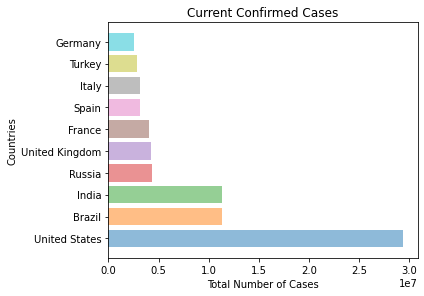

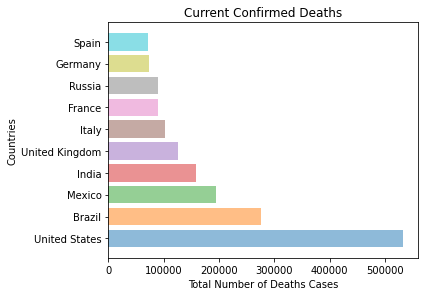

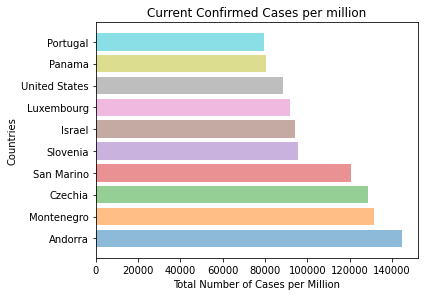

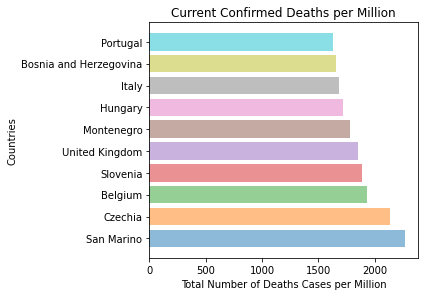

In [ ]:
bar_chart_compare_countries(top10cases,1)
bar_chart_compare_countries(top10deaths,2)
bar_chart_compare_countries(top10cases_per_million,3)
bar_chart_compare_countries(top10deaths_per_million,4)

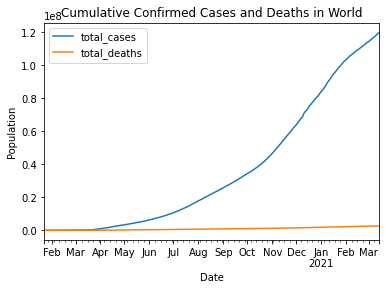

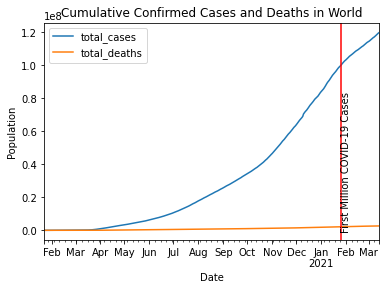

In [ ]:
#Time Series Data Visualisation - World
dv_cases_deaths("World",1)


ts_columns = ['total_cases', 'total_deaths']

timeseries_df = get_timeseries_per_country("World")

new_cases_num_df = timeseries_df[ts_columns]
new_cases_num_df.plot()

left, width = .25, .5
bottom, height = .25, .5
right = left + width
top = bottom + height

#plt.plot(timeseries_df.total_cases, color='blue')
#plt.plot(timeseries_df.total_deaths, color='orange')
plt.xlabel('Date')
plt.ylabel('Population')
plt.title('Cumulative Confirmed Cases and Deaths in {}'.format("World"))
x = new_cases_num_df.loc[new_cases_num_df.total_cases >= 100000000].head(1).index[0]
plt.axvline(pd.Timestamp(x), color='r')
plt.text(x, .5, "First Million COVID-19 Cases", rotation=90)
plt.show()

**Time Series Comparing Top 10 Countries**

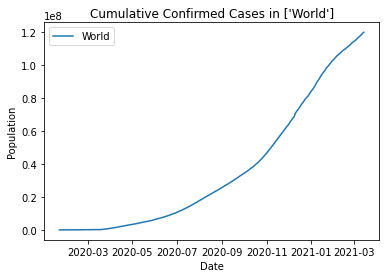

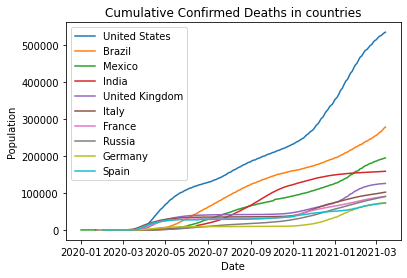

In [ ]:
dv_compare_cases_between_countries(['World'],'cases')
dv_compare_cases_between_countries(top10deaths,'deaths')

In [ ]:
world = get_timeseries_per_country("World")
world.loc[world.index == "2021-01-22"]

cases = world.loc[world.index == "2021-01-22"].total_cases[0]
deaths = world.loc[world.index == "2021-01-22"].total_deaths[0]

CFR = (deaths/cases)*100

print(CFR)

2.1523847857940495


### **Load - Data Visualisation - Indonesia vs Other Countries**

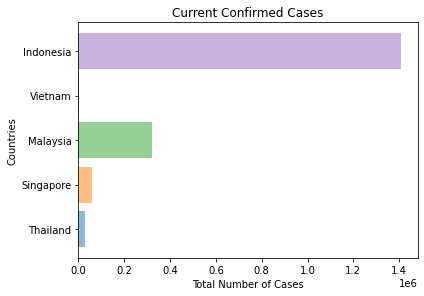

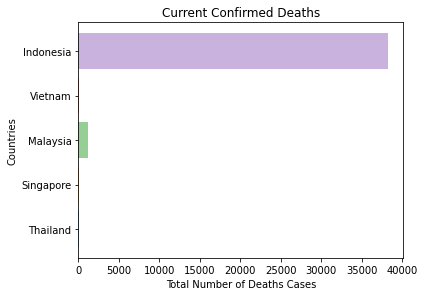

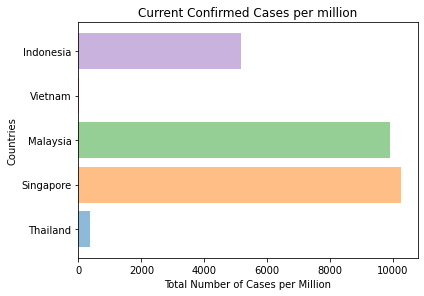

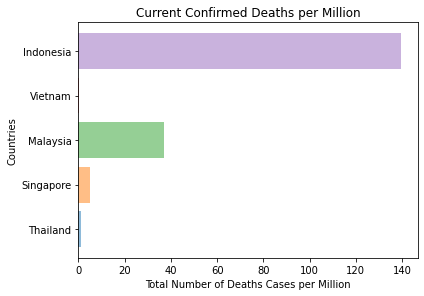

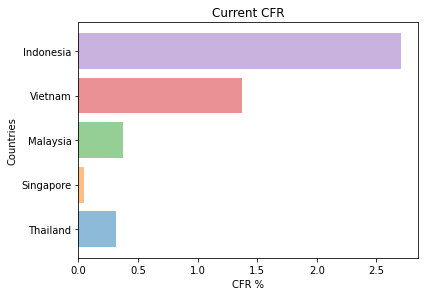

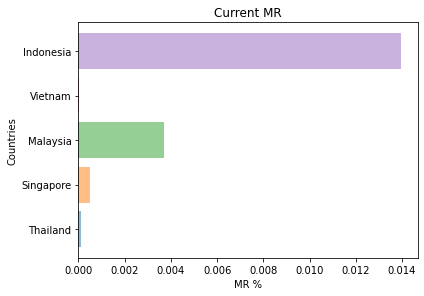

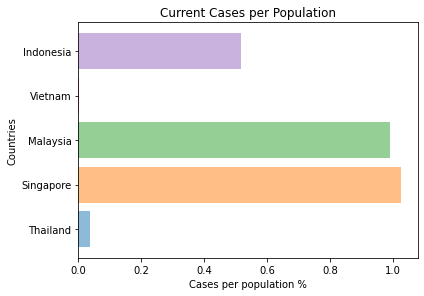

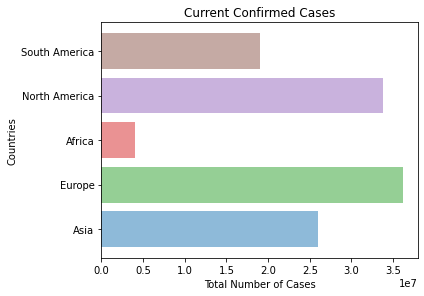

,iso_code,continent,country_name,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,CFR,MR,cases_per_population
0,SGP,Asia,Singapore,2021-03-12,60080.0,10.0,29.0,0.0,10269.483,1.709,4.957,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.93,5850343.0,7915.731,42.4,12.922,7.049,85535.383,0.0,92.243,10.99,0.0,2.4,83.62,0.938,0.000483,0.000005,0.010269


In [ ]:
#List of ASEAN countries used for this research
ASEAN = ['Thailand', 'Singapore', 'Malaysia', 'Vietnam', 'Indonesia']

#List of all continents
continents = current_COVID_df.continent.unique().tolist()[:-1]

bar_chart_compare_countries(ASEAN,1)
bar_chart_compare_countries(ASEAN,2)
bar_chart_compare_countries(ASEAN,3)
bar_chart_compare_countries(ASEAN,4)
bar_chart_compare_countries(ASEAN,5)
bar_chart_compare_countries(ASEAN,6)
bar_chart_compare_countries(ASEAN,7)

bar_chart_compare_countries(continents, 1)

get_current_cases_country("Singapore")

In [ ]:
get_timeseries_per_country("Indonesia")

,iso_code,continent,country_name,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-03-02,IDN,Asia,Indonesia,2.0,2.0,0.0,0.0,0.007,0.007,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,28.70,273523621.0,145.725,29.3,5.319,3.053,11188.744,5.7,342.864,6.32,64.204,1.04,71.72,0.718
2020-03-03,IDN,Asia,Indonesia,2.0,0.0,0.0,0.0,0.007,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,37.04,273523621.0,145.725,29.3,5.319,3.053,11188.744,5.7,342.864,6.32,64.204,1.04,71.72,0.718
2020-03-04,IDN,Asia,Indonesia,2.0,0.0,0.0,0.0,0.007,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,37.04,273523621.0,145.725,29.3,5.319,3.053,11188.744,5.7,342.864,6.32,64.204,1.04,71.72,0.718
2020-03-05,IDN,Asia,Indonesia,2.0,0.0,0.0,0.0,0.007,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,37.04,273523621.0,145.725,29.3,5.319,3.053,11188.744,5.7,342.864,6.32,64.204,1.04,71.72,0.718
2020-03-06,IDN,Asia,Indonesia,4.0,2.0,0.0,0.0,0.015,0.007,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,37.04,273523621.0,145.725,29.3,5.319,3.053,11188.744,5.7,342.864,6.32,64.204,1.04,71.72,0.718
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-10,IDN,Asia,Indonesia,1398578.0,5633.0,37932.0,175.0,5113.189,20.594,138.679,0.640,0.0,0.0,0.0,0.0,0.168,6.0,people tested,4837576.0,3574698.0,1262878.0,0.0,1.77,1.31,0.46,0.00,273523621.0,145.725,29.3,5.319,3.053,11188.744,5.7,342.864,6.32,64.204,1.04,71.72,0.718
2021-03-11,IDN,Asia,Indonesia,1403722.0,5144.0,38049.0,117.0,5131.996,18.806,139.107,0.428,0.0,0.0,0.0,0.0,0.156,6.4,people tested,4991674.0,3696059.0,1295615.0,154098.0,1.82,1.35,0.47,0.00,273523621.0,145.725,29.3,5.319,3.053,11188.744,5.7,342.864,6.32,64.204,1.04,71.72,0.718
2021-03-12,IDN,Asia,Indonesia,1410134.0,6412.0,38229.0,180.0,5155.438,23.442,139.765,0.658,0.0,0.0,0.0,0.0,0.155,6.5,people tested,5108536.0,3769174.0,1339362.0,116862.0,1.87,1.38,0.49,0.00,273523621.0,145.725,29.3,5.319,3.053,11188.744,5.7,342.864,6.32,64.204,1.04,71.72,0.718


In [ ]:
#Visualise Time Series of number of cases and Government Response Index
#dv_compare_cases_between_countries(['Indonesia'], "new cases")

def dv_change_daily(country):
  df = get_timeseries_per_country("Indonesia")

  df.drop(df.tail(1).index,inplace=True)

  df_difference = []

  for i in range(len(df)-1):
    difference = df['new_cases'][i]-df['new_cases'][i-1] 
    if i == 0:
      df_difference.append({
          'date': df.index[i],
          'difference': df['new_cases'][i]-0
      })
    else:
      df_difference.append({
          'date': df.index[i],
          'difference': difference
      })

  difference_df = pd.DataFrame(df_difference)

  print(len(difference_df))

  plt.plot(difference_df, label = "Indonesia")

  plt.xlabel('Date')
  plt.ylabel('Population')
  plt.title('New Cases in {}'.format("Indonesia"))
  plt.legend(loc="upper left")
  plt.show()

#dv_change_daily("Indonesia")

#data_table.DataTable(df[['new_cases', 'daily_percentage_change_cases', 'log_daily_percentage_change_cases']])


No handles with labels found to put in legend.


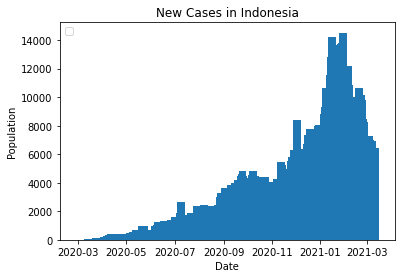

377
376


In [ ]:
#data_table.DataTable(df_dif)
df = get_timeseries_per_country("Indonesia")

df.drop(df.tail(1).index,inplace=True)

df_difference =[]

for i in range(len(df)-1):
  difference = df['new_cases'][i]-df['new_cases'][i-1]
  pct_change = 0 
  if difference == 0:
    pct_change = 0
  elif df['new_cases'][i-1] == 0:
    pct_change = 0
  else:
    pct_change = difference/df['new_cases'][i-1] 
  if i == 0:
    df_difference.append({
        'date': df.index[i],
        'difference': df['new_cases'][i]
    })
  else:
    df_difference.append({
        'date': df.index[i],
        'difference': df['new_cases'][i]
    })

difference_df = pd.DataFrame(df_difference)


max = difference_df.difference.max()
min = difference_df.difference.min()

difference_df.index = pd.to_datetime(difference_df.index)


#difference_df.plot(x='date')

ax = plt.subplot(111)
ax.bar(difference_df.date, difference_df.difference, width=10)
ax.xaxis_date()

plt.xlabel('Date')
plt.ylabel('Population')
plt.title('New Cases in {}'.format("Indonesia"))
plt.legend(loc="upper left")
plt.show()

print(len(df))
print(len(difference_df))

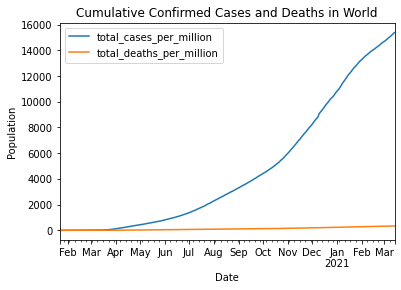

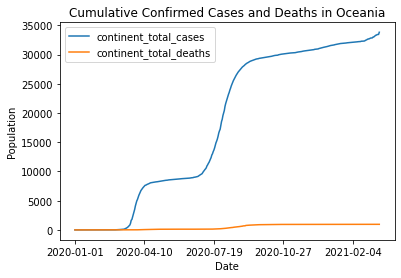

In [ ]:
dv_cases_deaths_per_million("World", 1)
dv_cases_deaths_per_million("Oceania", 2)

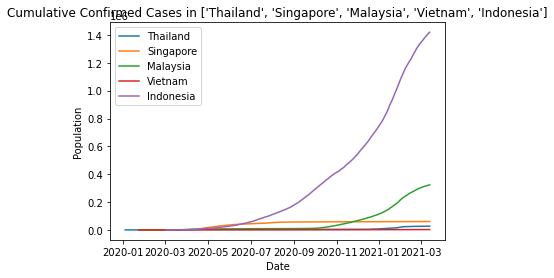

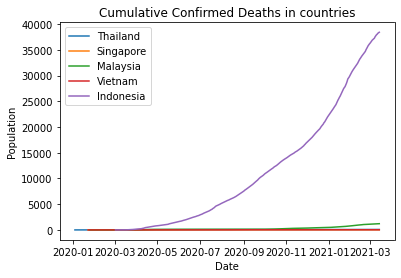

In [ ]:
dv_compare_cases_between_countries(ASEAN, "cases")
dv_compare_cases_between_countries(ASEAN, "deaths")

### **Load - Check Curve Flattened**

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


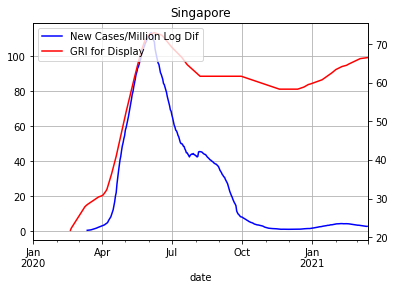

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


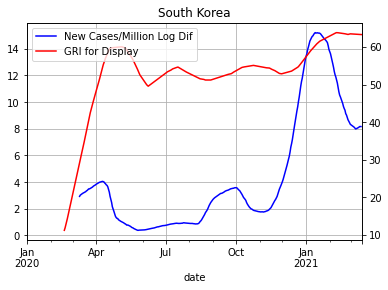

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


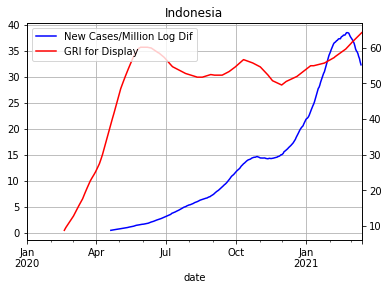

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


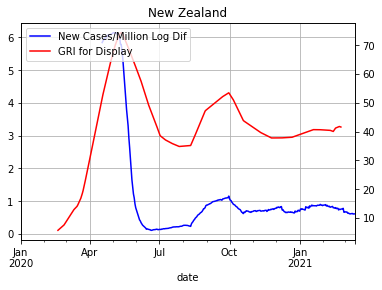

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


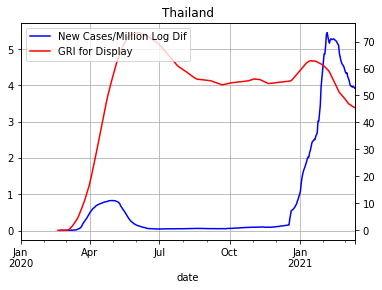

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


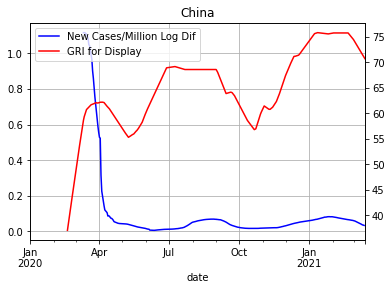

In [ ]:
def check_curve(countries):

  for country in countries:
    tsdf = get_timeseries_per_country(country)
    gri = GR_df[['date','country_name', 'government_response_index_for_display']].copy()

    tsdf = tsdf.loc[(tsdf.continent != 0) & (tsdf.iso_code != "GEO") & (tsdf.country_name==country)]
    tsdf['new_cases_per_million_log'] = np.log(tsdf['new_cases_per_million'])
    tsdf = tsdf[['country_name', 'total_cases','new_cases_per_million','new_cases_per_million_log']]
    tsdf = tsdf.replace([np.inf, -np.inf, np.nan], 0)
    gri = gri.loc[gri.country_name==country]
    
    #set index and sort by index
    #tsdf.set_index('date', inplace=True)
    gri.set_index('date', inplace=True)
    tsdf.sort_index()
    gri.sort_index()
    
    tsdf['MA_new_cases'] = tsdf.new_cases_per_million.rolling(window=50).mean()
    gri['MA_gri'] = gri.government_response_index_for_display.rolling(window=50).mean()

    ax1 = tsdf.MA_new_cases.plot(color='blue', grid=True, label = "New Cases/Million Log Dif")
    ax2 = gri.MA_gri.plot(color='red', grid=True, secondary_y=True, label = "GRI for Display")
    h1, l1 = ax1.get_legend_handles_labels()
    h2, l2 = ax2.get_legend_handles_labels()
    plt.legend(h1+h2, l1+l2, loc=2)
    plt.title(country)
    
    plt.show()


countries = ['Singapore', 'South Korea', 'Indonesia', 'New Zealand', 'Thailand', 'China']
check_curve(countries)

## **Load - Linear Regression, Correlation and Confidence Test**

In [ ]:
#Dates for 4 points to check the regression results
DATE_ONE = '2020-04-03'
DATE_TWO = '2020-08-03'
DATE_THREE = '2020-12-03'
DATE_FOUR = yesterday.strftime(DATE_FORMAT)

dates = [DATE_ONE, DATE_TWO, DATE_THREE, DATE_FOUR]

results_cor_coef = []

results_coef_det = []

def lin_reg(date):

  linear_regression_df = get_corr_lr_df(date)
  linear_regression_initial_df = get_corr_lr_df(DATE_ONE)

  linear_regression_df['rural_to_urban_ratio'] = np.log10(linear_regression_df['rural_population']/linear_regression_df['urban_population'])

  #linear_regression_df['log_GDP'] = np.log10(linear_regression_df['gdp_per_capita'])

  #Check correlation between each factor and current number of cases
  Y = linear_regression_df['log10_cases_per_1mil'].values.reshape(-1,1)  
  X = linear_regression_df['human_development_index'].values.reshape(-1,1) 

  y = linear_regression_df.log10_cases_per_1mil
  x = linear_regression_df.human_development_index

  cc = x.corr(y)

  reg = LinearRegression().fit(X, Y)  # create object for the class

  y_pred = reg.predict(X)

  plt.scatter(X, Y)
  plt.plot(X, y_pred, color='red')
  plt.title('Log Cases/1M vs HDI - Date: {}'.format(date))
  plt.ylabel('Log Cases/1M')
  plt.xlabel('Human Development Index')
  plt.show()

  cd = reg.score(X,Y)
  print("R: {}".format(cc))
  print("R2: {}".format(cd))



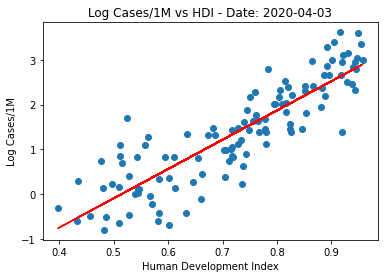

R: 0.8719927137895184
R2: 0.7603712929020091


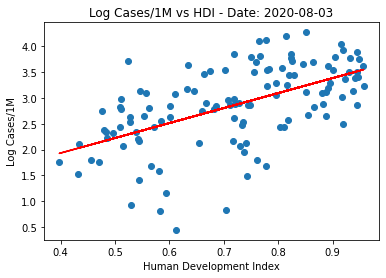

R: 0.559941910650954
R2: 0.3135349433034411


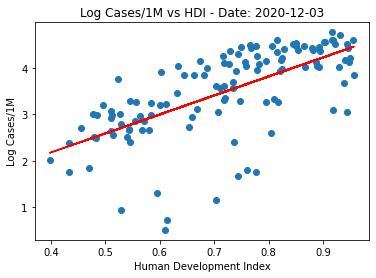

R: 0.6581636648591254
R2: 0.4331794097407953


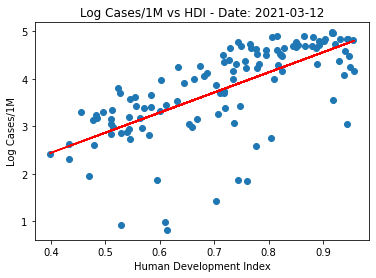

R: 0.6744370517950191
R2: 0.45486533683395775


In [ ]:
lin_reg(DATE_ONE)
lin_reg(DATE_TWO)
lin_reg(DATE_THREE)
lin_reg(DATE_FOUR)

import seaborn as sns

In [ ]:
#linear_regression_df = get_corr_lr_df(DATE_FOUR)

#sns.pairplot(linear_regression_df)

**Check Correlation**

In [ ]:
lr = get_corr_lr_df(DATE_FOUR)
lr
#linear_regression_df.iloc[:, 2]

,iso_code,country_name,total_cases,total_deaths,total_cases_per_million,total_deaths_per_million,population,population_density,gdp_per_capita,life_expectancy,human_development_index,key_x,rural_population,urban_population,country_code,poverty_rate,average_iq,key_y,stringency_legacy_index_for_display,government_response_index_for_display,containment_health_index_for_display,economic_support_index_for_display,log10_cases_per_1mil
0,AFG,Afghanistan,55959.0,2454.0,1437.487,63.039,38928341.0,54.422,1803.987,64.83,0.511,AF,28244481.0,9797273.0,AF,54.5,84,AFG,20.24,18.89,21.79,0.0,3.157604
1,ALB,Albania,116123.0,2018.0,40351.310,701.230,2877800.0,104.871,11803.431,78.57,0.795,AL,1106598.0,1747593.0,AL,14.3,90,ALB,67.86,65.22,63.72,75.0,4.605858
2,DZA,Algeria,115008.0,3031.0,2622.697,69.120,43851043.0,17.348,13913.839,76.88,0.748,DZ,11542954.0,31510100.0,DZ,5.5,83,DZA,76.90,61.56,67.18,25.0,3.418748
3,AGO,Angola,21265.0,519.0,647.016,15.791,32866268.0,23.890,5819.495,61.15,0.581,AO,10764270.0,21061025.0,AO,32.3,68,AGO,72.62,48.44,55.90,0.0,2.810915
4,ARG,Argentina,2185747.0,53578.0,48361.753,1185.465,45195777.0,16.177,18933.907,76.67,0.845,AR,3599141.0,41339571.0,AR,35.5,93,ARG,65.48,66.28,68.78,50.0,4.684502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117,VEN,Venezuela,144786.0,1422.0,5091.655,50.007,28435943.0,36.253,16745.022,72.06,0.711,VE,3353461.0,25162368.0,VE,33.1,84,VEN,91.67,71.89,75.26,50.0,3.706859
118,VNM,Vietnam,2550.0,35.0,26.197,0.360,97338583.0,308.127,6171.884,75.40,0.704,VN,61129966.0,35332140.0,VN,6.7,94,VNM,73.33,60.56,62.18,50.0,1.418252
119,YEM,Yemen,2729.0,679.0,91.497,22.765,29825968.0,53.508,1479.147,66.12,0.470,YE,18292399.0,10869523.0,YE,48.6,85,YEM,29.76,22.22,25.64,0.0,1.961407
120,ZMB,Zambia,84240.0,1149.0,4582.256,62.500,18383956.0,22.995,3689.251,63.89,0.584,ZM,9989317.0,7871713.0,ZM,54.4,79,ZMB,32.14,30.56,35.26,0.0,3.661079


In [ ]:
import statsmodels.api as sm

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
def OLS_summary(date):
  linear_regression_df = get_corr_lr_df(date)

  #Check correlation between each factor and current number of cases
  #Y = linear_regression_df['log10_cases_per_1mil']  # values converts it into a numpy array
  #X = linear_regression_df.total_cases_per_million.values.reshape(-1, 1)
  #X = linear_regression_df['government_response_index_for_display'] # -1 means that calculate the dimension of rows, but have 1 column

  Y = linear_regression_df['log10_cases_per_1mil'].values.reshape(-1,1)  
  X = linear_regression_df['human_development_index'].values.reshape(-1,1) 

  reg = LinearRegression().fit(X, Y)  # create object for the class

  y_pred = reg.predict(X)

  y = linear_regression_df.log10_cases_per_1mil
  x = linear_regression_df.human_development_index

  cc = x.corr(y)

  print("Correlation: {}".format(cc))

  print("R2: {}".format(reg.score(X,Y)))

  X = sm.add_constant(X) # adding a constant
  
  model = sm.OLS(Y, X).fit()
  predictions = model.predict(X) 
  
  print_model = model.summary()
  print(print_model)

In [ ]:
OLS_summary(DATE_ONE)
OLS_summary(DATE_TWO)
OLS_summary(DATE_THREE)
OLS_summary(DATE_FOUR)

Correlation: 0.8719927137895184
R2: 0.7603712929020091
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.760
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     361.7
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.67e-37
Time:                        14:11:54   Log-Likelihood:                -95.997
No. Observations:                 116   AIC:                             196.0
Df Residuals:                     114   BIC:                             201.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------

## **Machine Learning**

### **Pre-processing**

In [ ]:
#Gets data frame for GRI only 
GRI_df = GR_df[['country_name','key','region_name','date', 'government_response_index', 'government_response_index_for_display']].copy()

In [ ]:
X_new_cases_million = timeseries_country_df.copy() 
X_new_cases_million = X_new_cases_million.loc[(timeseries_country_df.continent != 0) & (timeseries_country_df.iso_code != "GEO")&(timeseries_country_df.country_name=="Indonesia")]
X_new_cases_million.set_index('date', inplace=True)

#X_new_cases_million = add_PCT(X_new_cases_million, "Indonesia")

#X_new_cases_million['daily_percentage_change_cases'] = X_new_cases_million['daily_percentage_change_cases'] * 100

#timeseries_country_df[['date','country_name','new_cases_per_million']].copy() 
#GRI_df

In [ ]:
GRI_df.set_index('date', inplace=True)

In [ ]:
GRI_df

,country_name,key,region_name,government_response_index,government_response_index_for_display
date,,,,,
2020-01-01,Aruba,ABW,NaN,0.00,0.00
2020-01-02,Aruba,ABW,NaN,0.00,0.00
2020-01-03,Aruba,ABW,NaN,0.00,0.00
2020-01-04,Aruba,ABW,NaN,0.00,0.00
2020-01-05,Aruba,ABW,NaN,0.00,0.00
...,...,...,...,...,...
2021-03-11,Zimbabwe,ZWE,NaN,44.56,44.56
2021-03-12,Zimbabwe,ZWE,NaN,44.56,44.56
2021-03-13,Zimbabwe,ZWE,NaN,44.56,44.56


### **Check Stationarity**










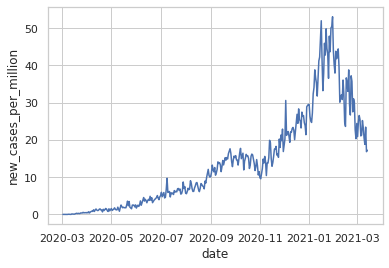

In [ ]:
sns.lineplot(data = X_new_cases_million, x = X_new_cases_million.index,
             y = X_new_cases_million.new_cases_per_million)

**Autocorrelation**

In [ ]:
#pd.plotting.autocorrelation_plot(X_new_cases_million.new_cases_per_million)

In [ ]:
#%pip install dtw

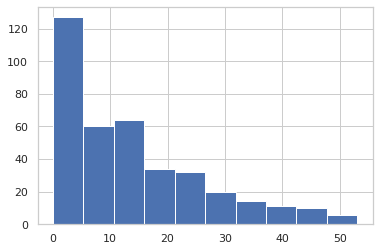

In [ ]:
d1 = X_new_cases_million.new_cases_per_million
d1.hist()
#d1.plot()
plt.show()

In [ ]:
from statsmodels.tsa.stattools import adfuller
d1 = X_new_cases_million.new_cases_per_million
X= d1.values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -2.180901
p-value: 0.213250
Critical Values:
	1%: -3.448
	5%: -2.869
	10%: -2.571


Text(0.5, 1.0, 'Differencing at n = 1')

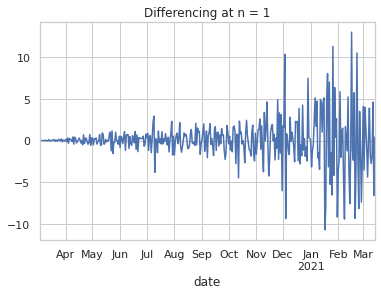

In [ ]:
#Differencing 
X_new_cases_million['new_cases_per_million_diff'] = X_new_cases_million['new_cases_per_million'] - X_new_cases_million['new_cases_per_million'].shift(1)
X_new_cases_million['new_cases_per_million_diff'].dropna().plot()
plt.title('Differencing at n = {}'.format(1))


/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


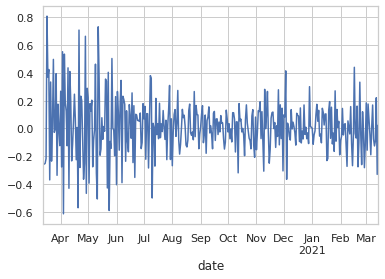

In [ ]:
#Transformation
X_new_cases_million['new_cases_per_million_log'] = np.log(X_new_cases_million['new_cases_per_million'])
X_new_cases_million['new_cases_per_million_log_diff'] = X_new_cases_million['new_cases_per_million_log'] - X_new_cases_million['new_cases_per_million_log'].shift(1)
X_new_cases_million['new_cases_per_million_log_diff'][11:].dropna().plot()
x = X_new_cases_million[['country_name', 'total_cases', 'new_cases_per_million_diff','new_cases_per_million_log_diff']]
x = x.fillna(method='ffill')
x = x.replace([np.inf, -np.inf, np.nan], 0)
x = x.sort_index()

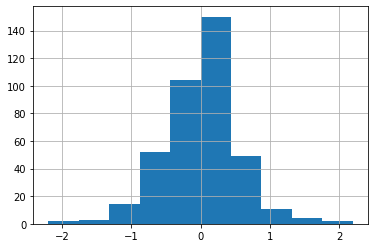

ADF Statistic: -13.147759
p-value: 0.000000
Critical Values:
	1%: -3.447
	5%: -2.869
	10%: -2.571
Reject the H0. Data does not have a unit root and IS stationary


In [ ]:
d1 = x.new_cases_per_million_log_diff
d1.hist()
#d1.plot()
plt.show()

X = d1.values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

if result[1] > 0.05:
  print("Fail to reject the H0. Data has a unit root and is NON-stationary")
elif result[1] <= 0.05:
  print("Reject the H0. Data does not have a unit root and IS stationary")
 
#pd.plotting.autocorrelation_plot(x.new_cases_per_million_log_diff)

<function matplotlib.pyplot.show>

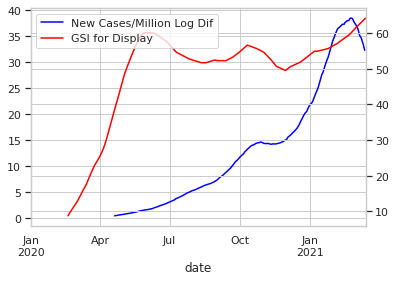

In [ ]:
#Granger Casualty Test - test the relationship before building the model
x = X_new_cases_million[['country_name', 'total_cases','new_cases_per_million', 'new_cases_per_million_diff','new_cases_per_million_log_diff']]
x = x.replace([np.inf, -np.inf, np.nan], 0)
x.sort_index()



y = GRI_df[['country_name', 'government_response_index_for_display']]
y.sort_index()
y = y.loc[y.country_name=="Indonesia"]

x['MA_new_cases'] = x.new_cases_per_million.rolling(window=50).mean()
y['MA_gri'] = y.government_response_index_for_display.rolling(window=50).mean()

GCtest = x.merge(y, how='inner', on="country_name")
GCtest = GCtest.fillna(method='ffill')

ax1 = x.MA_new_cases.plot(color='blue', grid=True, label = "New Cases/Million Log Dif")
ax2 = y.MA_gri.plot(color='red', grid=True, secondary_y=True, label = "GSI for Display")

h1, l1 = ax1.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()

plt.legend(h1+h2, l1+l2, loc=2)
plt.show

In [ ]:
ihsg_covid_df = X_new_cases_million[['country_name','new_cases_per_million_diff', 'new_cases_per_million_log_diff']]

In [ ]:
GCtest = GCtest.fillna(method='ffill')
GCtest = GCtest.replace([np.inf, -np.inf, np.nan], 0)
GCtest.tail(5)

,country_name,total_cases,new_cases_per_million,new_cases_per_million_diff,new_cases_per_million_log_diff,MA_new_cases,government_response_index_for_display,MA_gri
166315,Indonesia,1419455.0,17.234,0.391,0.022949,32.31758,69.06,63.3228
166316,Indonesia,1419455.0,17.234,0.391,0.022949,32.31758,69.06,63.5340
166317,Indonesia,1419455.0,17.234,0.391,0.022949,32.31758,69.06,63.7452
166318,Indonesia,1419455.0,17.234,0.391,0.022949,32.31758,69.06,63.9564
166319,Indonesia,1419455.0,17.234,0.391,0.022949,32.31758,69.06,64.1676


In [ ]:
GCtest[['MA_gri', 'MA_new_cases', 'government_response_index_for_display']].corr(method="spearman")

,MA_gri,MA_new_cases,government_response_index_for_display
MA_gri,1.000000,0.001338,0.086749
MA_new_cases,0.001338,1.000000,0.000000
government_response_index_for_display,0.086749,0.000000,1.000000


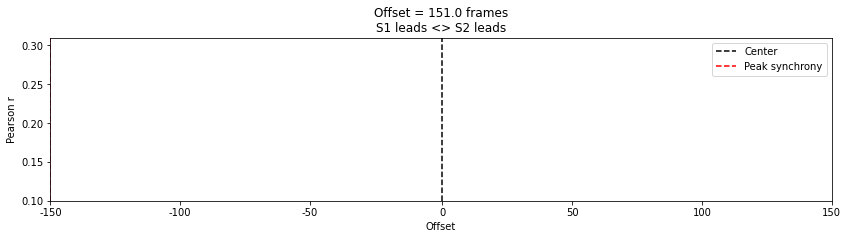

In [ ]:
def crosscorr(datax, datay, lag=0, wrap=False):
    """ Lag-N cross correlation. 
    Shifted data filled with NaNs 
    
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length
    Returns
    ----------
    crosscorr : float
    """
    if wrap:
        shiftedy = datay.shift(lag)
        shiftedy.iloc[:lag] = datay.iloc[-lag:].values
        return datax.corr(shiftedy)
    else: 
        return datax.corr(datay.shift(lag))

d2 = GCtest['MA_new_cases']
d1 = GCtest['MA_gri']
seconds = 5
fps = 30
rs = [crosscorr(d1,d2, lag) for lag in range(-int(seconds*fps),int(seconds*fps+1))]
offset = np.ceil(len(rs)/2)-np.argmax(rs)
f,ax=plt.subplots(figsize=(14,3))
ax.plot(rs)
ax.axvline(np.ceil(len(rs)/2),color='k',linestyle='--',label='Center')
ax.axvline(np.argmax(rs),color='r',linestyle='--',label='Peak synchrony')
ax.set(title=f'Offset = {offset} frames\nS1 leads <> S2 leads',ylim=[.1,.31],xlim=[0,301], xlabel='Offset',ylabel='Pearson r')
ax.set_xticks([0, 50, 100, 151, 201, 251, 301])
ax.set_xticklabels([-150, -100, -50, 0, 50, 100, 150]);
plt.legend()

In [ ]:

#Check correlation between each factor and current number of cases
Y = GCtest['MA_new_cases']  # values converts it into a numpy array
#X = linear_regression_df.total_cases_per_million.values.reshape(-1, 1)
X = GCtest['MA_gri'] # -1 means that calculate the dimension of rows, but have 1 column

X = sm.add_constant(X) # adding a constant
 
model = sm.OLS(Y, X).fit()
predictions = model.predict(X) 
 
print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:           MA_new_cases   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.2368
Date:                Thu, 18 Feb 2021   Prob (F-statistic):              0.627
Time:                        04:28:25   Log-Likelihood:            -7.9824e+05
No. Observations:              162265   AIC:                         1.596e+06
Df Residuals:                  162263   BIC:                         1.596e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         25.6899      0.384     66.971      0.0

In [ ]:
#

In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests

results = grangercausalitytests(GCtest[['MA_gri', 'MA_new_cases']],2)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0003  , p=0.9858  , df_denom=162261, df_num=1
ssr based chi2 test:   chi2=0.0003  , p=0.9858  , df=1
likelihood ratio test: chi2=0.0003  , p=0.9858  , df=1
parameter F test:         F=0.0003  , p=0.9858  , df_denom=162261, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0002  , p=0.9998  , df_denom=162258, df_num=2
ssr based chi2 test:   chi2=0.0004  , p=0.9998  , df=2
likelihood ratio test: chi2=0.0004  , p=0.9998  , df=2
parameter F test:         F=0.0002  , p=0.9998  , df_denom=162258, df_num=2


#**Stocks Data Pre-Processing**

## **Stock Market Data - Extract**

In [ ]:
#Gets company list listed in IDX from IDX's (Indonesia Stock Exchange) website
#file_path = 'https://idx.co.id/media/8127/09_listed-companies-by-entry-point-2020-en.pdf'

#Converts and downloads the content from PDF to CSV so it can be uploaded to github
#and use pd.read_csv instead of calling tabula
#tabula.convert_into(file_path, 'company_list.csv',stream=True, pages='all')

In [ ]:
#Reads in the CSV file from github
file_path = 'https://raw.githubusercontent.com/filbertmiko/Analysis-of-COVID-19-and-its-Impact-on-IHSG-and-Rupiah/main/company_list.csv'

#Convert it into a pandas dataframe
company_list = pd.read_csv(file_path)

**Clean**

In [ ]:
#Cleaning dataframe
#Detele any NaNs
idx_company_list = company_list.dropna()

#Filter out unwanted records
idx_companies = idx_company_list[idx_company_list.No != "No"]

#Convert column's data type
convert_dict = {'Kode': str, 
                'Nama Perusahaan': str
               } 
  
idx_companies = idx_companies.astype(convert_dict) 
idx_companies = idx_companies.reset_index()

#Drop unwanted columns
idx_companies = idx_companies.drop(['index','No','Entry Point', 'Sektor', 'Subsektor'], axis=1)

#Rename columns
idx_companies = idx_companies.rename(columns={"Kode": "Symbol", "Nama Perusahaan": "Name"}, errors="raise")

In [ ]:
#Add IDX's extension for yfinance
#Example -> BBCA becomes BBCA.JK

JKSE_symbol = ".JK"
idx_companies['Symbol'] = idx_companies['Symbol'].astype(str) + JKSE_symbol

## **Stock Market Data - Transform**

In [ ]:
#Get information for the inputted Symbol and
#Turns the returned values (dict) to dataframe

wanted_columns = ['city', 'symbol', 'longName', 'sector','industry', 'previousClose', 'fullTimeEmployees', 'marketCap']
#Use a for loop to loop through the company list dataframe and then for each
#iteration, call the function, and combine the returned df to the bigger df
def turn_info_into_df(ticker):
  #Get information for the inputted Symbol and
  symbol = yf.Ticker(ticker)

  keys = [*symbol.info.keys()]
  values = [*symbol.info.values()]

  items = [keys, values]
  df = pd.DataFrame(items)
  new_header = df.iloc[0] #grab the first row for the header
  df = df[1:] #take the data less the header row
  df.columns = new_header #set the header row as the df header
  df = df[wanted_columns]
  
  return(df)

turn_info_into_df("BBCA.JK")

,city,symbol,longName,sector,industry,previousClose,fullTimeEmployees,marketCap
1,Jakarta,BBCA.JK,PT Bank Central Asia Tbk,Financial Services,Banks—Regional,33800,26123,816080494788608


In [ ]:
#Combine table from idx_companies to the stock's details taken from yfinance
unavailable_comp = 0

def find_available_companies(unavailable_companies):
  companies_list = pd.DataFrame()
  idx_list = idx_companies.Symbol.tolist()

  start_time = time.time()
  #Start timer
  tic = time.perf_counter()
  for i in range(len(idx_list)):
    company = idx_companies.Symbol[i]
    try:
      df = turn_info_into_df(company)
      companies_list = companies_list.append(df, ignore_index = True)
    except:
      print("{} is not available in Yahoo Finance".format(company))
      unavailable_companies += 1
  
  #End timer
  toc = time.perf_counter()

  print("Available no. of companies: {}".format(len(companies_list.symbol)))
  print("Unavailable no. of companies: {}".format(unavailable_companies))

  print("--- %s seconds ---" % (toc -  tic))

  return companies_list
  

In [ ]:
#companies_list = companies_list.drop(columns=['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1', 'Unnamed: 0.1.1.1'])

In [ ]:
#companies_list = find_available_companies(unavailable_comp)
companies_list = pd.read_csv("/content/Analysis-of-COVID-19-and-its-Impact-on-IHSG-and-Rupiah/yfinance_companies_list_IHSG.csv")
companies_list = companies_list[wanted_columns]

In [ ]:
companies_list

,city,symbol,longName,sector,industry,previousClose,fullTimeEmployees,marketCap
0,Jakarta,AALI.JK,PT Astra Agro Lestari Tbk,Consumer Defensive,Farm Products,10850,32599,2.150841e+13
1,Jakarta,ABBA.JK,PT Mahaka Media Tbk,Communication Services,Publishing,73,753,2.700018e+11
2,Jakarta,ABDA.JK,PT Asuransi Bina Dana Arta Tbk,Financial Services,Insurance—Property & Casualty,6950,509,4.361169e+12
3,Jakarta Selatan,ABMM.JK,PT ABM Investama Tbk,Energy,Thermal Coal,745,5520,2.064877e+12
4,Jakarta,ACES.JK,PT Ace Hardware Indonesia Tbk,Consumer Cyclical,Specialty Retail,1565,17075,2.674209e+13
...,...,...,...,...,...,...,...,...
617,Jakarta,YPAS.JK,PT Yanaprima Hastapersada Tbk,Consumer Cyclical,Packaging & Containers,620,20,3.874400e+11
618,South Jakarta,YULE.JK,PT Yulie Sekuritas Indonesia Tbk,Financial Services,Capital Markets,398,13,7.104300e+11
619,Surabaya,ZBRA.JK,PT Zebra Nusantara Tbk,Consumer Cyclical,Specialty Retail,60,30,1.382392e+10
620,Jakarta Utara,ZINC.JK,PT Kapuas Prima Coal Tbk,Basic Materials,Other Industrial Metals & Mining,131,167,3.307750e+12


In [ ]:
#industries is a list of the industries in IHSG
industries = companies_list.industry.unique()
#sectors is a list of the sectors in IHSG
sectors = companies_list.sector.unique()

#companies_symbol is a list of the symbols of companies that are listed on Yahoo Finance
#companies_symbol = companies_list.Symbol
len(industries)

97

In [ ]:
companies_list.loc[companies_list['city'].str.contains('Jakarta', case=False), 'city'] = 'Jakarta'
companies_list

,city,symbol,longName,sector,industry,previousClose,fullTimeEmployees,marketCap
0,Jakarta,AALI.JK,PT Astra Agro Lestari Tbk,Consumer Defensive,Farm Products,10850,32599,2.150841e+13
1,Jakarta,ABBA.JK,PT Mahaka Media Tbk,Communication Services,Publishing,73,753,2.700018e+11
2,Jakarta,ABDA.JK,PT Asuransi Bina Dana Arta Tbk,Financial Services,Insurance—Property & Casualty,6950,509,4.361169e+12
3,Jakarta,ABMM.JK,PT ABM Investama Tbk,Energy,Thermal Coal,745,5520,2.064877e+12
4,Jakarta,ACES.JK,PT Ace Hardware Indonesia Tbk,Consumer Cyclical,Specialty Retail,1565,17075,2.674209e+13
...,...,...,...,...,...,...,...,...
617,Jakarta,YPAS.JK,PT Yanaprima Hastapersada Tbk,Consumer Cyclical,Packaging & Containers,620,20,3.874400e+11
618,Jakarta,YULE.JK,PT Yulie Sekuritas Indonesia Tbk,Financial Services,Capital Markets,398,13,7.104300e+11
619,Surabaya,ZBRA.JK,PT Zebra Nusantara Tbk,Consumer Cyclical,Specialty Retail,60,30,1.382392e+10
620,Jakarta,ZINC.JK,PT Kapuas Prima Coal Tbk,Basic Materials,Other Industrial Metals & Mining,131,167,3.307750e+12


In [ ]:
comp = companies_list.copy()
comp = comp.groupby(by='city').sum()
comp = comp.sort_values('marketCap',ascending=False)
comp = comp.reset_index()
comp

,city,previousClose,fullTimeEmployees,marketCap
0,Jakarta,670859,1411255,5.411609e+15
1,Tangerang,40399,180841,3.924120e+14
2,Bandung,7860,38297,3.660947e+14
3,Surabaya,8639,40945,2.234646e+14
4,Bekasi,19502,24794,9.601145e+13
5,Serang,12212,12991,7.071571e+13
6,Kediri,36600,31732,7.037359e+13
7,Kudus,1175,997,5.936897e+13
8,Sidoarjo,12553,10168,3.099525e+13
9,Bangka,1890,4444,1.333147e+13


In [ ]:
#Gets the Market Cap of all the companies in IHSG that are listed in Yahoo Finance
jkse_market_cap = companies_list.marketCap.sum()


In [ ]:
#Gets the Market Cap for each sector
sector_marketcap_df = pd.DataFrame(columns = ['sector', 'market_cap'])
for sect in sectors:
  marketcap = companies_list.marketCap.loc[companies_list.sector == sect].sum()

  sector_marketcap_df = sector_marketcap_df.append({'sector': sect,
                                                    'market_cap': marketcap}, ignore_index=True)

In [ ]:
#Gets the Market cap for each industry
ind_marketcap_df = pd.DataFrame(columns = ['industry', 'market_cap'])
for ind in industries:
  marketcap = companies_list.marketCap.loc[companies_list.industry == ind].sum()

  ind_marketcap_df = ind_marketcap_df.append({'industry': ind,
                                              'market_cap': marketcap}, ignore_index=True)

## **Stocks - Load**

**Outputs the wanted dataset to CSV into Github Repository**

In [ ]:
#companies_list.to_csv("yfinance_companies_list_IHSG.csv")

In [ ]:
#all_df.to_csv("stock_prices_data.csv")

# **Stock Market - Data Visualisation**

### **DV Time Series - Prices**

In [ ]:
jkse = yf.Ticker("^JKSE")
jkse_prices = jkse.history(start="2020-01-01", end="2021-03-06")
jkse_prices

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2020-01-02,6313.127930,6317.013184,6263.675781,6283.581055,33043700,0,0
2020-01-03,6306.187012,6323.465820,6287.706055,6323.465820,44625300,0,0
2020-01-06,6293.499023,6300.436035,6252.634766,6257.402832,41421300,0,0
2020-01-07,6272.220215,6284.892090,6246.128906,6279.346191,39441600,0,0
2020-01-08,6248.442871,6250.122070,6218.129883,6225.686035,44622600,0,0
...,...,...,...,...,...,...,...
2021-03-01,6281.856934,6339.008789,6261.559082,6338.513184,173079500,0,0
2021-03-02,6367.438965,6388.121094,6329.498047,6359.205078,180676700,0,0
2021-03-03,6378.797852,6394.452148,6334.244141,6376.756836,242358700,0,0


In [ ]:
((jkse_prices.Close.tail(1).values[0] -jkse_prices.Close.head(1).values[0]) / jkse_prices.Close.head(1).values[0] ) * 100
#jkse_prices.Close[:1].values[0] 
#(New Value - Original Value) / Original Value
#((jkse_prices.Close[-1:].values[0] - jkse_prices.Close[:1].values[0]) / jkse_prices.Close[:1].values[0]) *100

-0.39518916098767454

In [ ]:
desc = jkse_prices.describe()
desc = desc[['Close']]

In [ ]:
def index_fund_ytd(indexf, start_date, end_date):

  WHO_pandec = "2020-03-11" #Taken from WHO's website
  WHO_pandec = datetime.strptime(WHO_pandec, '%Y-%m-%d')

  fig, axes = plt.subplots(len(indexf), 1, figsize=(13, 20))
  fig.suptitle('Index Prices from {} to {}'.format(start_date, end_date), fontsize=14, fontweight='bold', y=0.92)

  ytd = []

  for i in range(len(indexf)):
    
    indfund = yf.Ticker(list(indexf.values())[i])
    indfund_prices = indfund.history(start=start_date, end=end_date)
    indfund_prices = indfund_prices.reset_index()

    initial_price = indfund_prices.Close[:1].values[0]
    current_price = indfund_prices.Close[-1:].values[0]

    ytd_performance = ((current_price - initial_price) / initial_price) *100
    ytd.append(ytd_performance)

    sns.lineplot(ax=axes[i], data=indfund_prices, x=indfund_prices.Date, y=indfund_prices.Close)

    lowest_price = indfund_prices.Close.min()
    lowest_date = indfund_prices.Date.loc[indfund_prices.Close == lowest_price]

    t = pd.to_datetime(str(lowest_date.values[0]))
    timestring = t.strftime('%Y-%m-%d')
    
    axes[i].axvline(x=lowest_date, color='red', zorder=2, linestyle = ':', label = "Lowest Price on {}".format(timestring))
    axes[i].legend(loc = 'upper left') 

  for i, ax in enumerate(axes.flatten()):
    ax.set_title("{} ({}%)".format(list(indexf.keys())[i], round(ytd[i], 2)))

  fig.subplots_adjust(hspace=0.5, bottom=0.1)
  #fig.tight_layout() 

  plt.show()

def index_fund_norm_ytd(indexf, start_date, end_date):

  WHO_pandec = "2020-03-11" #Taken from WHO's website
  WHO_pandec = datetime.strptime(WHO_pandec, '%Y-%m-%d')

  #Initialize the plot size and title
  fig, ax = plt.subplots(figsize=(15, 5))
  fig.suptitle('Index Prices from {} to {}'.format(start_date, end_date), fontsize=14, fontweight='bold', y=0.92)

  ytd_col = ['symbol', 'YTD_performance']

  ytd_list = []
  frames = list()

  return_df = pd.DataFrame()

  for i in range(len(indexf)):
    #Gets the symbol from indexf dictionary
    symbol = list(indexf.values())[i]
    
    #calls yfinance to get the historical  data for the respective symbol
    indfund = yf.Ticker(symbol)
    indfund_prices = indfund.history(start=start_date, end=end_date)
    indfund_prices = indfund_prices.reset_index()

    #Getting the return rate and normalised version of it, then putting it into
    #indfund_prices dataframe
    indfund_prices['Returns'] = indfund_prices.Close.pct_change().dropna()
    indfund_prices['normdata'] = (1+indfund_prices['Returns']).cumprod()
    #indfund_prices.normdata.iloc[:1] = 1

    #Calclating YtD Performance
    #Getting the initial price
    initial_price = indfund_prices.Close[:1].values[0]
    #Getting the final price
    current_price = indfund_prices.Close[-1:].values[0]

    #Getting the percentage change
    ytd_performance = ((current_price - initial_price) / initial_price) * 100

    ytd_list.append([symbol, ytd_performance])

    sns.lineplot(data=indfund_prices, x=indfund_prices.Date, y=indfund_prices.normdata,
                 label = "{} - YtD Change: {}%".format(list(indexf.keys())[i], round(ytd_performance, 2)))

  t = pd.to_datetime(str(WHO_pandec))
  timestring = t.strftime('%Y-%m-%d')
    
  ax.axvline(x=WHO_pandec, color='green', zorder=2, linestyle = ':', label = "WHO Declared COVID-19 as Pandemic on {}".format(timestring))
  ax.legend(bbox_to_anchor= (0.5, -0.1), loc = 'upper center', fancybox=True, shadow=True, ncol=2) 
  ax.set_xlabel("Date")
  ax.set_ylabel("Normalized Closing Price Percentage")
  fig.subplots_adjust(hspace=0.5, bottom=0.1)
  plt.show()

  df_list = list()

  ytd = pd.DataFrame(ytd_list, columns=ytd_col)
  #result = pd.concat(frames, axis=1, join='inner').reindex(frames[0].index)

  df_list.append(ytd)
  #df_list.append(result)

  return df_list

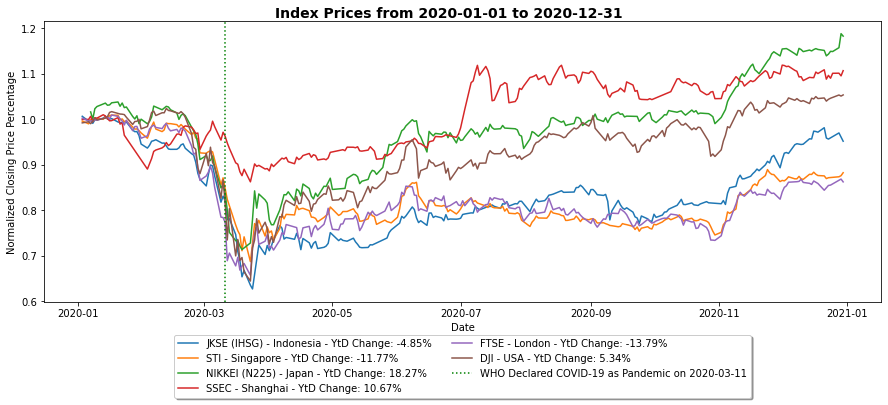

In [ ]:
ind = {'JKSE (IHSG) - Indonesia': '^JKSE',
       'STI - Singapore': '^STI',
       'NIKKEI (N225) - Japan': '^N225',
       'SSEC - Shanghai': '000001.SS',
       'FTSE - London': '^FTSE',
       'DJI - USA': '^DJI'}
#for index_fund in index_funds_worldwide:
# COMMENT - Change to a few weeks prior to each country's first reported case
#index_fund_ytd(ind, "2020-01-15", "2020-12-31")

exchange_rate = {'IDR/USD - Indonesia': 'IDR=X',
                 'SGD/USD': 'SGD=X',
                 'JPY/USD - Japan': 'JPY=X',
                 'CNY/USD - China': 'CNY=X',
                 'GBP/USD - London': 'GBP=X'}

n = pd.DataFrame()
n = index_fund_norm_ytd(ind, "2020-01-01", "2020-12-31")

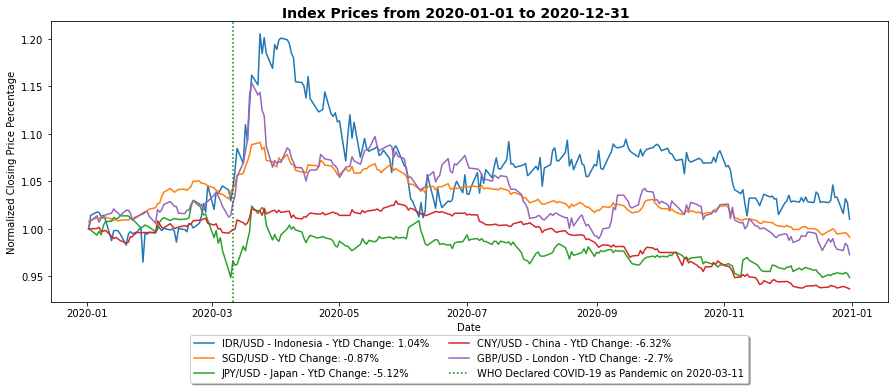

In [ ]:
e = index_fund_norm_ytd(exchange_rate, "2020-01-01", "2020-12-31")

In [ ]:
e

[  symbol  YTD_performance
 0  IDR=X         1.038595
 1  SGD=X        -0.866239
 2  JPY=X        -5.115887
 3  CNY=X        -6.321183
 4  GBP=X        -2.700264]

### **DV Time Series - Trading Volume**

In [ ]:
def volume_ytd(indexf, start_date, end_date):

  WHO_pandec = "2020-03-11" #Taken from WHO's website
  WHO_pandec = datetime.strptime(WHO_pandec, '%Y-%m-%d')

  fig, axes = plt.subplots(len(indexf)//2, 2, figsize=(20, 10))
  fig.suptitle('Trading Volume', fontsize=14, fontweight='bold', y=0.92)

  ytd = []

  si = 0
  for i in range(len(indexf)//2):
    for j in range(2):
      symbol = list(indexf.values())[si]
      indfund = yf.Ticker(symbol)
      indfund_prices = indfund.history(start=start_date, end=end_date)
      indfund_prices = indfund_prices.reset_index()

      sns.lineplot(ax=axes[i,j], data=indfund_prices, x=indfund_prices.Date, y=indfund_prices.Volume)

      t = pd.to_datetime(str(WHO_pandec))
      timestring = WHO_pandec.strftime('%Y-%m-%d')
      
      axes[i,j].axvline(x=WHO_pandec, color='red', linestyle=':', zorder=2, label = "COVID-19 Declared as Pandemic")
      axes[i,j].legend(loc = 'best') 

      si += 1

  for i, ax in enumerate(axes.flatten()):
    ax.set_title("{}".format(list(indexf.keys())[i]))

  fig.subplots_adjust(hspace=0.5, bottom=0.1)
  #fig.legend(axes[1,1].get_legend(), loc = 'lower center', fancybox=True) 
  plt.show()

def norm_volume_ytd(indexf, start_date, end_date):

  WHO_pandec = "2020-03-11" #Taken from WHO's website
  WHO_pandec = datetime.strptime(WHO_pandec, '%Y-%m-%d')

  fig, axes = plt.subplots(len(indexf)//2, 2, figsize=(20, 10))
  fig.suptitle('Trading Volume', fontsize=14, fontweight='bold', y=0.92)

  ytd = []

  si = 0
  for i in range(len(indexf)//2):
    for j in range(2):
      symbol = list(indexf.values())[si]
      indfund_prices = pd.DataFrame()
        
      indfund = yf.Ticker(symbol)
      indfund_prices = indfund.history(start=start_date, end=end_date)
      indfund_prices = indfund_prices.reset_index()

      volume = indfund_prices['Volume']
      indfund_prices['normvol'] = (volume - volume.min())/(volume.max() - volume.min())

      sns.lineplot(ax=axes[i,j], data=indfund_prices, x=indfund_prices.Date, y=indfund_prices.normvol)

      t = pd.to_datetime(str(WHO_pandec))
      timestring = WHO_pandec.strftime('%Y-%m-%d')
        
      axes[i,j].axvline(x=WHO_pandec, color='red', linestyle=':', zorder=2, label = "COVID-19 Declared as Pandemic")
      axes[i,j].legend(loc = 'best')

      si += 1

  for i, ax in enumerate(axes.flatten()):
    ax.set_title("{}".format(list(indexf.keys())[i]))

  fig.subplots_adjust(hspace=0.5, bottom=0.1)
  #fig.legend(axes[1,1].get_legend(), loc = 'lower center', fancybox=True) 
  plt.show()

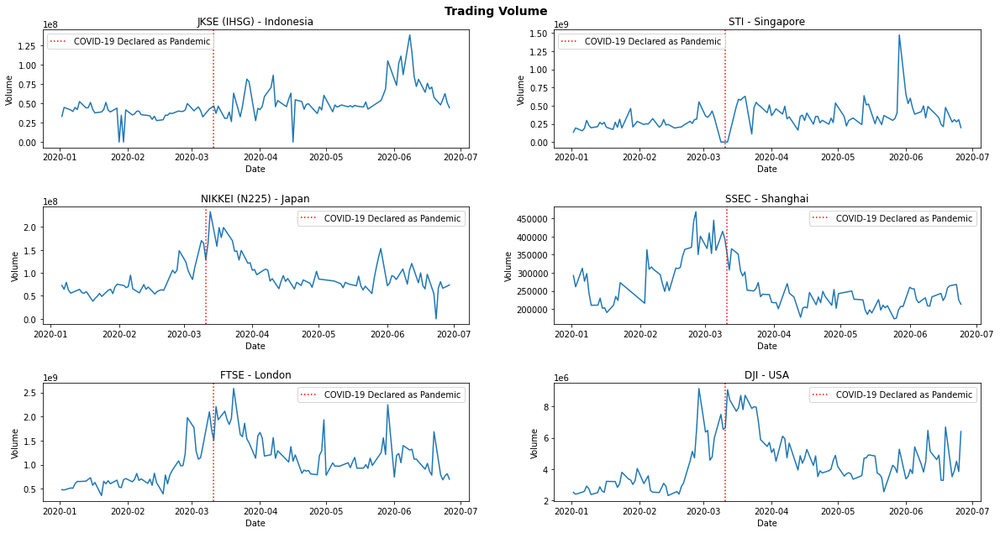

In [ ]:
volume_ytd(ind, "2020-01-01", "2020-06-29")

### **Volatility**

In [ ]:
def get_volatility(symbol):
  #Gets the symbol from indexf dictionary
  symbol = list(indexf.values())[i]
    
  #calls yfinance to get the historical  data for the respective symbol
  indfund = yf.Ticker(symbol)
  indfund_prices = indfund.history(start=start_date, end=end_date)
  indfund_prices = indfund_prices.reset_index()

  #Getting the return rate and normalised version of it, then putting it into
  #indfund_prices dataframe
  indfund_prices['Returns'] = indfund_prices.Close.pct_change().dropna()
  indfund_prices['logret'] = np.log(indfund_prices.Returns).diff()
  indfund_prices['normdata'] = (1+indfund_prices['Returns']).cumprod()

def volatility_ytd(indexf, start_date, end_date):

  WHO_pandec = "2020-03-11" #Taken from WHO's website
  WHO_pandec = datetime.strptime(WHO_pandec, '%Y-%m-%d')

  fig, axes = plt.subplots(len(indexf)//2, 2, figsize=(20, 10))
  fig.suptitle('Index Volatility', fontsize=14, fontweight='bold', y=0.92)

  volatility = []

  si = 0
  for i in range(len(indexf)//2):
    for j in range(2):
      symbol = list(indexf.values())[si]
      indfund_prices = pd.DataFrame()
        
      indfund = yf.Ticker(symbol)
      indfund_prices = indfund.history(start=start_date, end=end_date)
      indfund_prices = indfund_prices.reset_index()

       #Getting the return rate and normalised version of it, then putting it into
      #indfund_prices dataframe
      indfund_prices['Returns'] = indfund_prices.Close.pct_change().dropna()
      indfund_prices['normdata'] = (1+indfund_prices['Returns']).cumprod()

      window_size = len(indfund_prices)

      indfund_prices['Volatility'] = indfund_prices['Returns'].rolling(5).std()
      vol = indfund_prices.Volatility.iloc[-1] * 100
      volatility.append(vol)

      sns.lineplot(ax=axes[i,j], data=indfund_prices, x=indfund_prices.Date, y=indfund_prices.Volatility)

      t = pd.to_datetime(str(WHO_pandec))
      timestring = WHO_pandec.strftime('%Y-%m-%d')
        
      axes[i,j].axvline(x=WHO_pandec, color='red', linestyle=':', zorder=2, label = "COVID-19 Declared as Pandemic")
      axes[i,j].legend(loc = 'best')

      si += 1

  for i, ax in enumerate(axes.flatten()):
    ax.set_title("{} - Volatility: {}%".format(list(indexf.keys())[i], round(volatility[i],2)))

  fig.subplots_adjust(hspace=0.5, bottom=0.1)
  #fig.legend(axes[1,1].get_legend(), loc = 'lower center', fancybox=True) 
  plt.show()

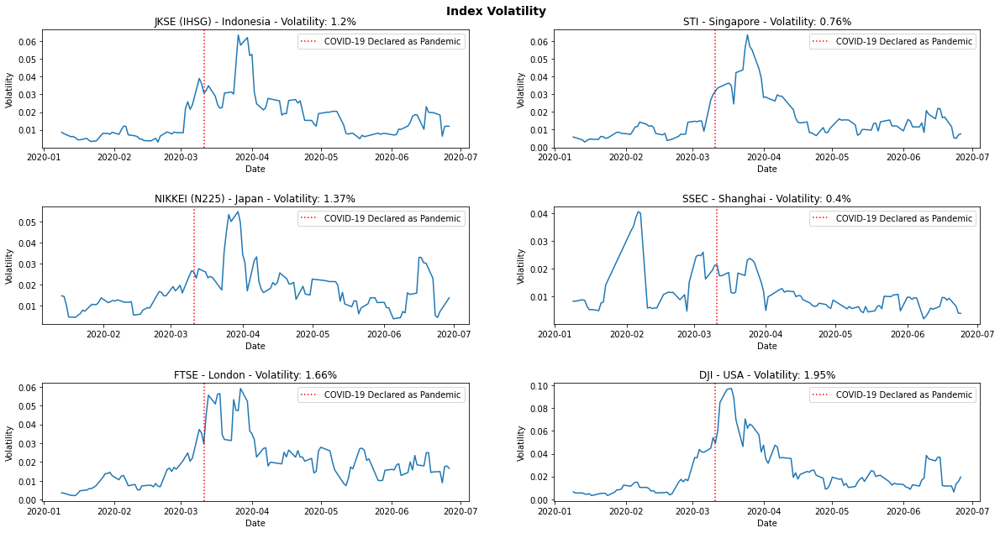

In [ ]:
volatility_ytd(ind, "2020-01-01", "2020-06-29")

In [ ]:
from pandas_datareader import data

### **IHSG - Sector Analysis**

In [ ]:
#Relocate the code into transform later
#Gets Close price of all stocks from 2017-01-01
"""
stocks_idx = companies_list.symbol.to_list()
all_df = pd.DataFrame()

for stock in stocks_idx:
  try:
    data = yf.Ticker(stock)
    stock_name = data.info["longName"]
    all_df[stock_name] = data.history(start="2017-01-01")['Close']
  except:
    pass
"""

'\nstocks_idx = companies_list.symbol.to_list()\nall_df = pd.DataFrame()\n\nfor stock in stocks_idx:\n  try:\n    data = yf.Ticker(stock)\n    stock_name = data.info["longName"]\n    all_df[stock_name] = data.history(start="2017-01-01")[\'Close\']\n  except:\n    pass\n'

In [ ]:
companies_list.rename({'longName': 'Name'}, axis=1, inplace=True)

In [ ]:
#Extract CSV from Github Repository
all_df = pd.read_csv("/content/Analysis-of-COVID-19-and-its-Impact-on-IHSG-and-Rupiah/stock_prices_data.csv")
all_df = all_df.set_index('Date')

all_df = all_df.loc[all_df.index > '2019' ,:]

df_ytd = all_df.loc[all_df.index > '2020' ,:]
df_hist = all_df.loc[all_df.index < '2020' ,:]

df_ytd_pc = (df_ytd.iloc[-1, :] - df_ytd.iloc[0, :]) / df_ytd.iloc[0, :] * 100
df_2020_pc = (df_ytd.iloc[df_ytd.index == "2020-12-30"].iloc[-1, :] - df_ytd.iloc[0,:]) / df_ytd.iloc[0, :] * 100

df_hist_pc = df_hist.pct_change()*100
std_stocks = df_hist_pc.std()

col_names = ['Name', 'YTD_performance', 'Typical_volatility', 'Sector', 'Industry']
df_summary = pd.DataFrame(columns=col_names)

for stock in std_stocks.index.values:

    name = stock
    pc_change = df_ytd_pc.loc[df_ytd_pc.index == stock].values[0]
    volatility = std_stocks.loc[std_stocks.index == stock].values[0]
    sector = companies_list.sector.loc[companies_list.Name == stock].values[0]
    industry = companies_list.industry.loc[companies_list.Name == stock].values[0]

    new_row = pd.DataFrame([[name, pc_change, volatility, sector, industry]], columns=col_names)
    df_summary = df_summary.append(new_row)

col_names = ['Name', '2020_performance', 'Typical_volatility', 'Sector', 'Industry']
df_2020_summary = pd.DataFrame(columns=col_names)

for stock in std_stocks.index.values:

    name = stock
    pc_change = df_2020_pc.loc[df_2020_pc.index == stock].values[0]
    volatility = std_stocks.loc[std_stocks.index == stock].values[0]
    sector = companies_list.sector.loc[companies_list.Name == stock].values[0]
    industry = companies_list.industry.loc[companies_list.Name == stock].values[0]

    new_row = pd.DataFrame([[name, pc_change, volatility, sector, industry]], columns=col_names)
    df_2020_summary = df_2020_summary.append(new_row)

In [ ]:
df_summary_merge = pd.merge(df_summary, companies_list[['Name', 'city','marketCap']], on='Name')

In [ ]:
df_sector_merge = df_summary_merge.groupby(['Sector']).mean()
df_sector_merge = df_sector_merge.sort_values(by=['YTD_performance'], ascending=False)

In [ ]:
df_sector = df_summary.groupby(['Sector']).mean()
df_sector = df_sector.sort_values(by=['YTD_performance'], ascending=False)

df_2020_sector = df_2020_summary.groupby(['Sector']).mean()
df_2020_sector = df_2020_sector.sort_values(by=['2020_performance'], ascending=False)

df_city = df_summary_merge.groupby(['city']).mean()
df_city = df_city.sort_values(by=['YTD_performance'], ascending=False)

#df_ytd.iloc[df_ytd.index == "2020-12-30"].iloc[-1, :]  - df_ytd.iloc[0,:]

In [ ]:
def visualise_ytd_sectors(year):
  ax = sns.set(style="whitegrid")
  plt.figure(1, figsize=(40,15))
  the_grid = GridSpec(2, 2)

  if year == "2020":
    data = df_2020_sector.sort_values('2020_performance',ascending=False)
    plt.subplot(the_grid[0, 0], title='2020 Average Performance (%)')
    ax = sns.barplot(x=data.index,y='2020_performance', data=data, palette='Spectral')

    for p in ax.patches:
      percentage = '{:.1f}%'.format(p.get_height())
      x = p.get_x() + p.get_width() / 2 - 0.05
      y = p.get_y() + p.get_height() 
      ax.annotate(percentage, (x-0.2, y), size = 12)

    plt.xlabel('Sector') 
    plt.xticks(rotation=35)
    plt.ylabel('Year-to-Date Performance (%)')
    plt.show()
    
  elif year == "YTD":
    data = df_sector.sort_values('YTD_performance',ascending=False)
    plt.subplot(the_grid[0, 0], title='Year to Date Average Performance (%)')
    ax = sns.barplot(x=data.index,y='YTD_performance', data=data, palette='Spectral')

    for p in ax.patches:
      percentage = '{:.1f}%'.format(p.get_height())
      x = p.get_x() + p.get_width() / 2 - 0.05
      y = p.get_y() + p.get_height() 
      ax.annotate(percentage, (x-0.2, y), size = 12)

    plt.xlabel('Sector') 
    plt.xticks(rotation=35)
    plt.ylabel('Year-to-Date Performance (%)')
    plt.show()

  else:
    print("Invalid Parameter")

def visualise_ytd_city():
  ax = sns.set(style="whitegrid")
  plt.figure(1, figsize=(50,10))
  the_grid = GridSpec(2, 2)

  data = df_city.copy()
  data = data.dropna()
  
  #combining top 5 with others
  columns = ['city', 'YTD_performance']
  new_row = pd.DataFrame([['Others', data.YTD_performance[5:].sum()]], columns=columns)
  #data2 = data2.append(new_row)

  plt.subplot(the_grid[0, 0], title='Year to Date Average Performance (%)')
  ax = sns.barplot(x=data.index,y='YTD_performance', data=data, palette='Spectral')

  plt.xlabel('Sector') 
  plt.xticks(rotation=70)
  plt.ylabel('Year-to-Date Performance (%)')
  plt.show()


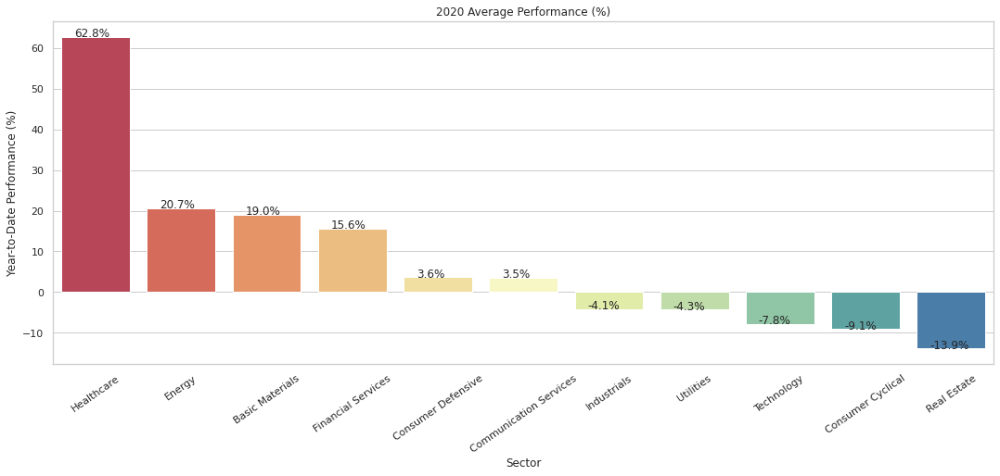

In [ ]:
visualise_ytd_sectors("2020")
#visualise_ytd_sector("YTD")
#visualise_ytd_city()

In [ ]:
#Data Visualisation of Market Cap of IHSG per Sector
#Pie chart
def visualise_pc_market_cap_sector():
  fig1, ax1 = plt.subplots(figsize=(10, 8), subplot_kw=dict(aspect="equal"))

  labels = sector_marketcap_df.sector.tolist()
  data = sector_marketcap_df.market_cap.tolist()

  ax1.pie(data,  labels=labels, autopct='%1.1f%%', explode=[0.05]*len(data), startangle=90, pctdistance=0.85)
  #draw circle
  centre_circle = plt.Circle((0,0),0.70,fc='white')
  fig = plt.gcf()
  fig.gca().add_artist(centre_circle)
  # Equal aspect ratio ensures that pie is drawn as a circle
  ax1.axis('equal')  
  #fig1.tight_layout()
  fig1.show()

def visualise_market_cap_sector():
  data = sector_marketcap_df.sort_values('market_cap',ascending=False).reset_index()

  ax2 = sns.set(style="whitegrid")

  plt.figure(2, figsize=(20,15))
  the_grid = GridSpec(2, 2)

  plt.subplot(the_grid[0, 0], title='Market Capitalization of IHSG per Sector')
  ax2 = sns.barplot(x='market_cap',y='sector', data=data, palette='Spectral')

  for p in ax2.patches:
    percentage = '{:.1f}%'.format(100 * (p.get_width()/sector_marketcap_df.market_cap.sum()))
    x = p.get_x() + p.get_width() / 2 - 0.05
    y = p.get_y() + p.get_height() 
    ax2.annotate(percentage, (x + 0.3, y-0.25), size = 12)

  plt.xlabel('Market Cap (%)') 
  plt.ylabel('Sector')
  plt.show()

#Data Visualisation of Market Cap of a Sector per Industry
def visualise_market_cap_industry(sector):
  comp = companies_list.sort_values('marketCap',ascending=False).copy()
  comp = comp.loc[comp.sector == sector]

  comp = comp.groupby(by='industry').sum()
  comp = comp.sort_values('marketCap',ascending=False).reset_index()

  ax2 = sns.set(style="whitegrid")

  plt.figure(2, figsize=(20,15))
  the_grid = GridSpec(2, 2)

  plt.subplot(the_grid[0, 0], title='Market Capitalization of {} Sector per Industry'.format(sector))
  ax2 = sns.barplot(x='marketCap',y='industry', data=comp, palette='Spectral')

  for p in ax2.patches:
    percentage = '{:.1f}%'.format(100 * (p.get_width()/comp.marketCap.sum()))
    x = p.get_x() + p.get_width() / 2 - 0.05
    y = p.get_y() + p.get_height() 
    ax2.annotate(percentage, (x + 0.3, y-0.25), size = 12)

  plt.xlabel('Market Cap (%)') 
  plt.ylabel('Industry')
  plt.show()

def visualise_market_cap_city():
  data = companies_list.copy()

  data = data.groupby(by='city').sum()
  data = data.sort_values('marketCap',ascending=False)

  #the top 5
  data2 = data.copy()
  data2 = data2[:5]
  data2 = data2.reset_index()

  #combining top 5 with others
  columns = ['city', 'previousClose', 'fullTimeEmployees', 'marketCap']
  new_row = pd.DataFrame([['Others', 0, 0,  data.marketCap[5:].sum()]], columns=columns)
  data2 = data2.append(new_row)

  ax2 = sns.set(style="whitegrid")

  plt.figure(2, figsize=(20,10))
  the_grid = GridSpec(2, 2)

  plt.subplot(the_grid[0, 0], title='Market Capitalization per City')
  ax2 = sns.barplot(y='marketCap',x='city', data=data2, palette='Spectral')

  for p in ax2.patches:
    percentage = '{:.1f}%'.format(100 * (p.get_height()/comp.marketCap.sum()))
    x = p.get_x() + p.get_width() / 2 - 0.05
    y = p.get_y() + p.get_height() 
    ax2.annotate(percentage, (x - 0.2, y), size = 12)

  plt.xlabel('Market Cap (%)') 
  plt.xticks(rotation=30)
  plt.ylabel('Industry')
  plt.show()

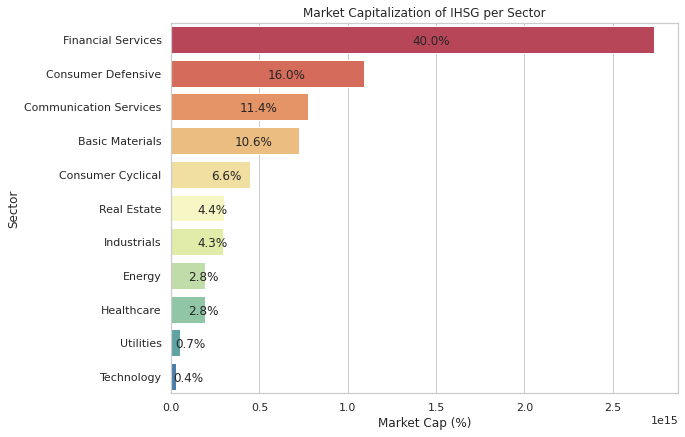

In [ ]:
visualise_market_cap_sector()
#visualise_pc_market_cap_sector()
#visualise_market_cap_industry('Healthcare')
#visualise_market_cap_city()

In [ ]:
stocks = companies_list.symbol.tolist()
yf_data = yf.download(stocks, start = "2020-01-01")

[*********************100%***********************]  622 of 622 completed

2 Failed downloads:
- HDTX.JK: No data found, symbol may be delisted
- MITI.JK: No data found, symbol may be delisted


In [ ]:
ddata = yf_data.copy()
#ddata
#yf_data['Close']

In [ ]:
sector_data = companies_list[companies_list.sector == "Energy"].dropna()

stocks = sector_data.symbol.tolist()
len(stocks)
#stocks.remove('BCIC.JK')
#ddata['Close']["2020-07-22":"2020-08-10"]
data_table.DataTable(ddata['Close'][stocks[20:35]])

,INDY.JK,ITMG.JK,KKGI.JK,KOPI.JK,MBAP.JK,MEDC.JK,MIRA.JK,MITI.JK,MYOH.JK,RUIS.JK,SHIP.JK,SMMT.JK,SMRU.JK,TOBA.JK,WOWS.JK
Date,,,,,,,,,,,,,,,
2020-01-02,1210.0,11350.0,230.0,620.0,1980.0,706.878296,50.0,NaN,1310.0,248.0,760.0,124.0,50.0,368.0,230.0
2020-01-03,1225.0,11725.0,230.0,625.0,1980.0,770.370361,50.0,NaN,1310.0,248.0,765.0,108.0,50.0,362.0,220.0
2020-01-06,1235.0,11800.0,228.0,625.0,1980.0,766.137573,50.0,NaN,1310.0,244.0,760.0,112.0,50.0,358.0,224.0
2020-01-07,1275.0,11900.0,240.0,620.0,2050.0,761.904785,50.0,NaN,1310.0,244.0,760.0,113.0,50.0,358.0,214.0
2020-01-08,1245.0,11725.0,230.0,615.0,2030.0,774.603149,50.0,NaN,1305.0,244.0,755.0,115.0,50.0,358.0,210.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-16,1510.0,11875.0,298.0,570.0,2830.0,650.000000,50.0,NaN,1305.0,242.0,655.0,99.0,50.0,500.0,63.0
2021-03-17,1505.0,11725.0,288.0,570.0,2810.0,630.000000,50.0,NaN,1305.0,248.0,650.0,99.0,50.0,500.0,63.0
2021-03-18,1540.0,12275.0,296.0,570.0,2820.0,625.000000,50.0,NaN,1345.0,240.0,650.0,97.0,50.0,498.0,63.0


In [ ]:
def get_weighted_price(sector, enddate):
  sector_data = companies_list[companies_list.sector == sector].dropna()

  stocks = sector_data.symbol.tolist()
  if sector == "Financial Services":
    stocks.remove('BCIC.JK')
  sector_mc = sector_marketcap_df.market_cap[sector_marketcap_df.sector == sector].values[0]

  #yf_data = yf.download(stocks, start = startdate, end = enddate)
  yf_data = ddata[ddata.index <= enddate].copy()
  yf_data = yf_data[yf_data.index != "2020-12-09"]
  close_price = yf_data['Close'].ffill(axis='rows')
  close_price = close_price.bfill(axis='rows')
  close_price = close_price[stocks]
  close_price = close_price.dropna(axis=1, how='all')

  d = []
  for index, row in yf_data.iterrows():
    try:
      #print(vol)
      wpc = []
      pr = []
      for i in range(len(stocks)):
        try:
          symbol = stocks[i]
          comp_mc = sector_data.marketCap[sector_data.symbol == symbol].values[0]
          price = close_price[close_price.index == index][symbol].values[0]

          weight = comp_mc/sector_mc
          weighted_price = weight * price

          wpc.append(weighted_price)
          pr.append(price)
                 
        except Exception as e:
          print(e)
      vol = yf_data['Volume'][stocks].sum(axis=1)[index]
      mean_price = sum(pr) / len(pr)
      d.append([index, round(sum(wpc)), round(mean_price), vol]) 
      
    except Exception as e:
      print(e)
  
  cols = ['Date', 'Weighted_close_price', 'Unweighted_close_price','Volume']
  index_df = pd.DataFrame(d, columns=cols)
  index_df['Date'] = index_df['Date'].astype('datetime64[ns]')

  #Getting the return rate and normalised version of it, then putting it into
  #indfund_prices dataframe
  index_df['Returns'] = index_df.Weighted_close_price.pct_change().dropna()
  #index_df['logret'] = np.log(index_df.Returns).diff()
  index_df['Normdata'] = (1+index_df['Returns']).cumprod()  
  index_df['Volatility'] = index_df['Returns'].rolling(2).std()

  return index_df


In [ ]:
fx = get_weighted_price(sector = "Financial Services",enddate = "2020-12-31")

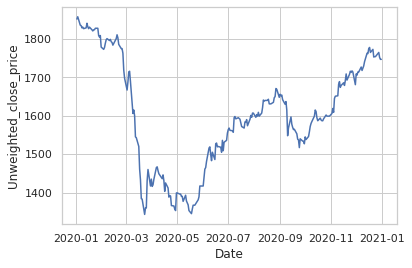

In [ ]:
sns.lineplot(data = fx, x = fx.Date, y = fx.Unweighted_close_price)

In [ ]:
sectors_list = []
for sector in sectors:
  df = get_weighted_price(sector = sector,
                          enddate = "2020-12-31")
  sectors_list.append(df)

'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'
'MITI.JK'


In [ ]:
def dv_sector_performance_ytd(sector_data, indicator): 

  WHO_pandec = "2020-03-11" #Taken from WHO's website
  WHO_pandec = datetime.strptime(WHO_pandec, '%Y-%m-%d')

  fig, axes = plt.subplots(len(sectors)//2+1, 2, figsize=(15, 15))
  fig.suptitle('Sector Performance in 2020 ({})'.format(indicator), fontsize=14, fontweight='bold', y=0.92)

  ytd = []

  si = 0
  for i in range((len(sectors)//2)+1):
    for j in range(2):
      if si < len(sectors):
        data = sector_data[si]
        sns.lineplot(ax=axes[i,j], data=data, x=data.Date, y=indicator)

        axes[i,j].axvline(x=WHO_pandec, color='red', linestyle=':', zorder=2, label = "COVID-19 Declared as Pandemic")
        axes[i,j].legend(loc = 'best')
        si += 1
      else:
        axes[i,j].remove()

  for i, ax in enumerate(axes.flatten()):
    if i < len(sectors):
      ax.set_title("{}".format(sectors[i]))
  

  fig.subplots_adjust(hspace=0.8, bottom=0.1)
  plt.show()

def dv_sector_performance_ytd_one_graph(sector_data,indicator, startdate, enddate): 

  WHO_pandec = "2020-03-11" #Taken from WHO's website
  WHO_pandec = datetime.strptime(WHO_pandec, '%Y-%m-%d')

  fig, ax = plt.subplots(figsize=(15, 5))
  fig.suptitle('Sector Performance from {} - {} ({})'.format(startdate, enddate, indicator), fontsize=14, fontweight='bold', y=0.92)

  ytd = []

  for i in range(len(sectors)):
    data = sector_data[i]
    data = data.set_index('Date')
    data = data[startdate:enddate]
    sns.lineplot(data=data, x='Date', y = indicator, label='{}'.format(sectors[i])) 

  timestring = WHO_pandec.strftime('%Y-%m-%d')
    
  ax.axvline(x=WHO_pandec, color='green', zorder=2, linestyle = ':', label = "COVID-19 Declared as Pandemic on {}".format(timestring))
  ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1),
            fancybox=True, shadow=True, ncol=5) 
  
  ax.set_xlabel("Date")
  if indicator == "Normdata":
    ax.set_ylabel("Normalized Price Change %")
  #fig.tight_layout() 
  plt.show()

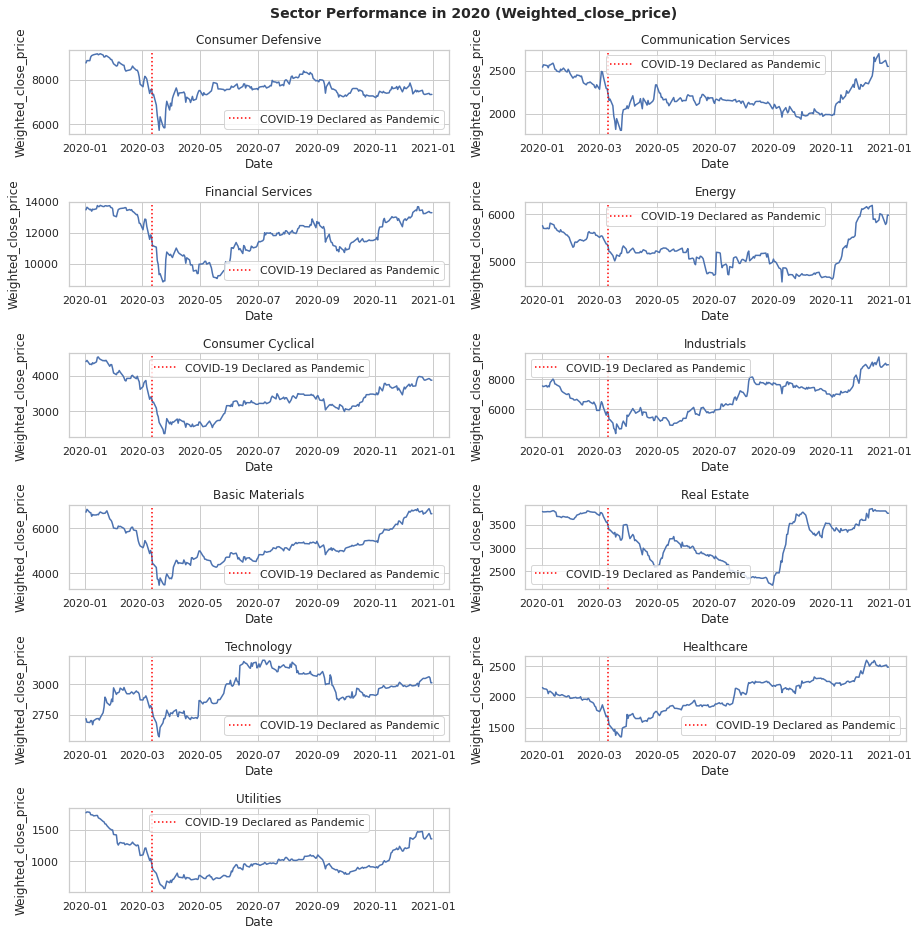

In [ ]:
#dv_sector_performance_ytd(sectors_list, "Volatility")
dv_sector_performance_ytd(sectors_list, "Weighted_close_price")
#dv_sector_performance_ytd(sectors_list, "Volume")
#dv_sector_performance_ytd_one_graph(sectors_list, "Volatility", "2020-01-01", "2020-05-10")
#dv_sector_performance_ytd_one_graph(sectors_list, "Normdata","2020-01-01", "2020-05-10")
#dv_sector_performance_ytd_one_graph(sectors_list, "Normdata","2020-01-01", "2020-12-31")

In [ ]:
#Get Datas such as YTD and all
def get_sector_stats(startdate, enddate):
  d = []
  for i in range(len(sectors)):
    data = sectors_list[i]
    data = data.set_index('Date')
    data = data[startdate:enddate]

    Sector = sectors[i]
    YTD_performance = ((data.Unweighted_close_price[-1:].values[0] - data.Unweighted_close_price[:1].values[0]) /
                       data.Unweighted_close_price[:1].values[0]) *100
    Max = data.Weighted_close_price.max()
    Highest_date = data.index[data.Weighted_close_price == Max].values[0]
    Min = data.Weighted_close_price.min()
    Lowest_date = data.index[data.Weighted_close_price == Min].values[0]
    Range = Max-Min
    first_to_last = "{} - {}".format(data.Weighted_close_price[1:2].values[0],data.Weighted_close_price[-1:].values[0])
    MarketCap = df_sector_merge.marketCap[df_sector_merge.index == Sector].values[0]
    YTD_JKSE = YTD_performance * ((MarketCap/df_sector_merge.marketCap.sum()))
    unweighted_ytd = df_sector_merge.YTD_performance[df_sector_merge.index == Sector].values[0] * ((MarketCap/df_sector_merge.marketCap.sum()))

    d.append([Sector, YTD_performance, Max, Min, Highest_date,
              Lowest_date, Range, first_to_last, MarketCap,
              YTD_JKSE, unweighted_ytd]) 
  
  cols = ['Sector', 'YTD_performance',
          'Max','Min', 'Highest_date',
          'Lowest_date', 'Range', 
          'First_to_last', 'MarketCap',
          'YTD_JKSE', 'unweighted_ytd']
  index_df = pd.DataFrame(d, columns=cols)
    
  return index_df

In [ ]:
df_sector_merge

,YTD_performance,Typical_volatility,marketCap
Sector,,,
Healthcare,54.501622,3.056603,1.071052e+13
Financial Services,34.030989,3.152437,2.896750e+13
Basic Materials,22.563108,3.386814,1.291454e+13
Communication Services,14.654968,3.434959,2.156858e+13
Energy,14.594274,2.866962,5.711361e+12
Technology,7.471721,6.460842,1.884465e+12
Consumer Defensive,6.876093,3.188089,1.496651e+13
Industrials,-0.267486,3.996869,2.818648e+12
Consumer Cyclical,-8.541783,3.823052,4.276847e+12


In [ ]:
sector_stats = get_sector_stats("2020-01-01", "2020-12-31")

In [ ]:
sector_stats.sort_values('YTD_performance',ascending=False)

,Sector,YTD_performance,Max,Min,Highest_date,Lowest_date,Range,First_to_last,MarketCap,YTD_JKSE,unweighted_ytd
9,Healthcare,21.420582,2594,1349,2020-12-08,2020-03-24,1245,2132 - 2482,1.071052e+13,1.990613,5.064832
3,Energy,8.419958,6181,4584,2020-12-14,2020-09-10,1597,5701 - 5977,5.711361e+12,0.417248,0.723215
6,Basic Materials,6.194125,6864,3468,2020-12-28,2020-03-19,3396,6834 - 6637,1.291454e+13,0.694071,2.528268
1,Communication Services,0.165153,2694,1809,2020-12-21,2020-03-24,885,2566 - 2548,2.156858e+13,0.030907,2.742530
8,Technology,-1.690141,3192,2573,2020-07-06,2020-03-19,619,2691 - 3010,1.884465e+12,-0.027635,0.122167
7,Real Estate,-3.105590,3853,2198,2020-12-14,2020-08-31,1655,3782 - 3753,4.582828e+12,-0.123487,-0.391656
5,Industrials,-4.324324,9482,4388,2020-12-21,2020-03-19,5094,7511 - 8966,2.818648e+12,-0.105756,-0.006542
2,Financial Services,-5.669546,13758,8846,2020-01-17,2020-03-23,4912,13638 - 13287,2.896750e+13,-1.424966,8.553240
0,Consumer Defensive,-13.646877,9171,5731,2020-01-17,2020-03-19,3440,8863 - 7342,1.496651e+13,-1.772143,0.892909
4,Consumer Cyclical,-20.573689,4539,2359,2020-01-15,2020-03-24,2180,4443 - 3879,4.276847e+12,-0.763451,-0.316969


In [ ]:
sector_stats.YTD_JKSE.sum()
#Compare with pre-covid

-2.34355429066318

In [ ]:
def visualise_ytd_sector(startdate, enddate):
  ax = sns.set(style="whitegrid")
  plt.figure(1, figsize=(40,15))
  the_grid = GridSpec(2, 2)

  data = get_sector_stats(startdate, enddate)
  data = data.sort_values('YTD_performance',ascending=False)

  plt.subplot(the_grid[0, 0], 
              title='{}-{} Average Performance (%)'.format(stardate, enddate))
  ax = sns.barplot(x=data.index,y='YTD_performance', data=data, palette='Spectral')

  for p in ax.patches:
    percentage = '{:.1f}%'.format(p.get_height())
    x = p.get_x() + p.get_width() / 2 - 0.05
    y = p.get_y() + p.get_height() 
    ax.annotate(percentage, (x-0.2, y), size = 12)

    plt.xlabel('Sector') 
    plt.xticks(rotation=35)
    plt.ylabel('Year-to-Date Performance (%)')
    plt.show()

### **COVID-19 and IHSG**

In [ ]:
symbol = "^JKSE"
    
#calls yfinance to get the historical  data for the respective symbol
indfund = yf.Ticker(symbol)
indfund_prices = indfund.history(start="2020-01-01", end="2021-03-14")
indfund_prices = indfund_prices.reset_index()

#Getting the return rate and normalised version of it, then putting it into
#indfund_prices dataframe
indfund_prices['Returns'] = indfund_prices.Close.pct_change().dropna()
indfund_prices['normdata'] = (1+indfund_prices['Returns']).cumprod()

In [ ]:
ihsg_covid_df = ihsg_covid_df.reset_index()

NameError: ignored

In [ ]:
ihsg_covid_df  = ihsg_covid_df.rename(columns={'date': 'Date'})

In [ ]:
ihsg_covid_df

In [ ]:
indfund_prices

In [ ]:
ihsg_covid_merge = ihsg_covid_df.merge(indfund_prices, how='inner', on="Date")

In [ ]:
ihsg_covid_merge = ihsg_covid_merge[~ihsg_covid_merge.isin([np.nan, np.inf, -np.inf]).any(1)]

In [ ]:
ihsg_covid_merge['log_returns'] = np.log(ihsg_covid_merge.normdata)

In [ ]:
ihsg_covid_merge = ihsg_covid_merge[ihsg_covid_merge.Date < "2020-12-31"]

In [ ]:
def ihsg_covid_merge_correlation():
  
  df = ihsg_covid_merge.copy()
  #Check correlation between each factor and current number of cases
  Y = df.new_cases_per_million_diff.values.reshape(-1,1)
  X = df.normdata.values.reshape(-1,1)

  y = df.new_cases_per_million_diff
  x = df.normdata

  cc = x.corr(y)

  reg = LinearRegression().fit(X, Y)  # create object for the class

  y_pred = reg.predict(X)

  plt.scatter(X, Y)
  plt.plot(X, y_pred, color='red')
  plt.title('New Cases/1M vs Normalized Return - 2020')
  plt.ylabel('Cases/1M')
  plt.xlabel('Normalized Return')
  plt.show()

  cd = reg.score(X,Y)
  print("R: {}".format(cc))
  print("R2: {}".format(cd))

  X = sm.add_constant(X) # adding a constant
  
  model = sm.OLS(Y, X).fit()
  predictions = model.predict(X) 
  
  print_model = model.summary()
  print(print_model)


In [ ]:
ihsg_covid_merge_correlation()